# Running SCENIC

#### First part ran as python script, downstream analysis in notebook

In [3]:
import dill
import scanpy as sc
import os
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import pyranges
# Set stderr to null to avoid strange messages from ray
import sys
_stderr = sys.stderr
null = open(os.devnull,'wb')
work_dir = '/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation_multiome/results/rna_atac/gene_regulatory_networks/scenicplus/blood/'
tmp_dir = '/home/bt392/ry/'


#### RNA 

In [21]:
cell_data =  pd.read_csv(work_dir+'epiblast_blood_sample_metadata.tsv', sep='\t')
adata = sc.read_h5ad("/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation_multiome/data/processed/rna/anndata.h5ad")

# Subset cells
adata = adata[cell_data['cell'], :]

# process
adata.raw = adata
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
adata = adata[:, adata.var.highly_variable]
sc.pp.scale(adata, max_value=10)

sc.pp.pca(adata) #calculate PCA embedding

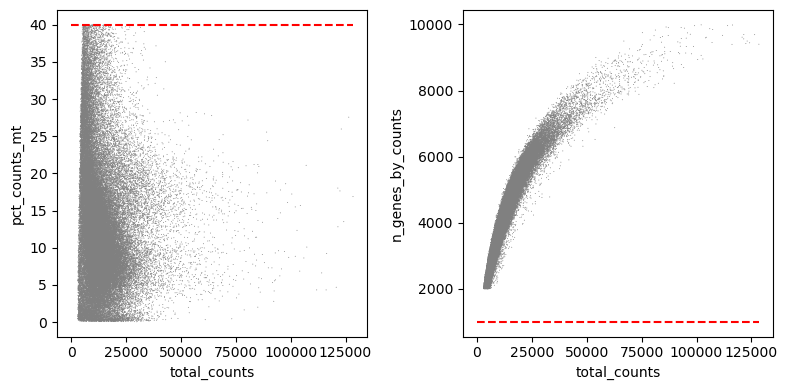

In [35]:
# Ricard used quote loose quality thresholds for RNA analysis
adata.var['mt'] = adata.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
import matplotlib.pyplot as plt
mito_filter = 40
n_counts_filter = 1000
fig, axs = plt.subplots(ncols = 2, figsize = (8,4))
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt', ax = axs[0], show=False)
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts', ax = axs[1], show = False)
#draw horizontal red lines indicating thresholds.
axs[0].hlines(y = mito_filter, xmin = 0, xmax = max(adata.obs['total_counts']), color = 'red', ls = 'dashed')
axs[1].hlines(y = n_counts_filter, xmin = 0, xmax = max(adata.obs['total_counts']), color = 'red', ls = 'dashed')
fig.tight_layout()
plt.show()

#### ATAC

In [6]:
# Load ATAC
cistopic_obj = dill.load(open(os.path.join(work_dir, 'pycistopic/epiblast_blood_cisTopicObject.pkl'), 'rb'))
menr = dill.load(open(os.path.join(work_dir, 'pycistopic/motifs/menr.pkl'), 'rb'))

# Start SCENIC+ analysis

In [14]:
adata.obs

,barcode,sample,nFeature_RNA,nCount_RNA,mitochondrial_percent_RNA,ribosomal_percent_RNA,stage,genotype,pass_rnaQC,doublet_score,doublet_call,celltype,celltype.score,closest.cell
E7.5_rep1#AAACAGCCATCCTGAA-1,AAACAGCCATCCTGAA-1,E7.5_rep1,2677,6034,21.63,6.36,E7.5,WT,True,0.12,False,Mixed_mesoderm,0.64,cell_87889
E7.5_rep1#AAACAGCCATGCTATG-1,AAACAGCCATGCTATG-1,E7.5_rep1,3985,11993,24.96,8.14,E7.5,WT,True,0.40,False,Primitive_Streak,0.60,cell_103930
E7.5_rep1#AAACATGCAGGATAAC-1,AAACATGCAGGATAAC-1,E7.5_rep1,4158,11545,11.63,5.62,E7.5,WT,True,0.21,False,Blood_progenitors_1,0.72,cell_22618
E7.5_rep1#AAACCGGCAACCCTAA-1,AAACCGGCAACCCTAA-1,E7.5_rep1,4430,12804,18.12,6.65,E7.5,WT,True,0.43,False,Nascent_mesoderm,1.00,cell_3500
E7.5_rep1#AAACCGGCAACCTAAT-1,AAACCGGCAACCTAAT-1,E7.5_rep1,3407,8154,9.92,5.47,E7.5,WT,True,0.24,False,Haematoendothelial_progenitors,0.76,cell_83273
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
E8.75_rep2#TTTGCGACATTAGGTT-1,TTTGCGACATTAGGTT-1,E8.75_rep2,5196,22396,15.69,7.59,E8.75,WT,True,0.16,False,Erythroid2,0.60,cell_71533
E8.75_rep2#TTTGCGGAGTAAGAAC-1,TTTGCGGAGTAAGAAC-1,E8.75_rep2,3458,10170,24.23,7.78,E8.75,WT,True,0.04,False,Erythroid3,0.56,cell_71533
E8.75_rep2#TTTGGCTGTAGTTGGC-1,TTTGGCTGTAGTTGGC-1,E8.75_rep2,3828,11198,14.26,8.64,E8.75,WT,True,0.14,False,Erythroid1,0.76,cell_66715
E8.75_rep2#TTTGTGGCATCTTGAG-1,TTTGTGGCATCTTGAG-1,E8.75_rep2,4068,13068,11.41,7.30,E8.75,WT,True,0.08,False,Erythroid2,0.52,cell_71533


In [15]:
cistopic_obj.cell_data

,cisTopic_log_nr_acc,cisTopic_nr_frag,cisTopic_nr_acc,cell,sample_id,cisTopic_log_nr_frag,barcode,sample,nFeature_RNA,nCount_RNA,...,ribosomal_percent_RNA,stage,genotype,pass_rnaQC,doublet_score,doublet_call,celltype,celltype.score,closest.cell,pycisTopic_leiden_10_0.6
E8.5_rep1#GAGCTAGCAACTCGCG-1___cisTopic,4.678373,120960,47684,NaN,cisTopic,5.082642,GAGCTAGCAACTCGCG-1,E8.5_rep1,6148,18987,...,5.95,E8.5,NaN,True,1.24,False,ExE_mesoderm,0.56,cell_63916,3
E8.5_rep1#TCCTCTAAGTCCTTCA-1___cisTopic,4.589626,95933,38871,NaN,cisTopic,4.981968,TCCTCTAAGTCCTTCA-1,E8.5_rep1,4936,12218,...,2.83,E8.5,NaN,True,0.45,False,ExE_mesoderm,0.96,cell_99030,3
E8.5_rep1#TCTTGACGTTACTTGC-1___cisTopic,4.583709,90337,38345,NaN,cisTopic,4.955866,TCTTGACGTTACTTGC-1,E8.5_rep1,5497,17736,...,7.36,E8.5,NaN,True,1.24,False,Haematoendothelial_progenitors,1.00,cell_19718,5
E8.5_rep1#TCAAGTATCTTAGCGG-1___cisTopic,4.569409,91865,37103,NaN,cisTopic,4.96315,TCAAGTATCTTAGCGG-1,E8.5_rep1,4867,12848,...,7.35,E8.5,NaN,True,1.11,False,Erythroid1,0.80,cell_77053,9
E8.5_rep1#TGAGTTTCACAACCTA-1___cisTopic,4.556182,86105,35990,NaN,cisTopic,4.935028,TGAGTTTCACAACCTA-1,E8.5_rep1,5698,16296,...,4.49,E8.5,NaN,True,1.18,False,Haematoendothelial_progenitors,0.88,cell_64562,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
E7.75_rep1#TGGATTCAGTTACTTC-1___cisTopic,3.207096,2904,1611,NaN,cisTopic,3.462997,TGGATTCAGTTACTTC-1,E7.75_rep1,6049,25779,...,2.41,E7.75,NaN,True,0.61,False,Primitive_Streak,0.56,cell_89701,0
E7.75_rep1#CGATTTGCATCCTGAA-1___cisTopic,3.237292,3127,1727,NaN,cisTopic,3.495128,CGATTTGCATCCTGAA-1,E7.75_rep1,3808,8331,...,7.20,E7.75,NaN,True,0.41,False,Primitive_Streak,0.48,cell_109507,2
E7.75_rep1#AAACGTACAATTGCGC-1___cisTopic,3.214844,3343,1640,NaN,cisTopic,3.524136,AAACGTACAATTGCGC-1,E7.75_rep1,5487,19983,...,2.97,E7.75,NaN,True,0.33,False,Epiblast,0.48,cell_87187,0
E7.75_rep1#TCCATCATCATTACGA-1___cisTopic,3.153815,2835,1425,NaN,cisTopic,3.452553,TCCATCATCATTACGA-1,E7.75_rep1,5031,18322,...,3.50,E7.75,NaN,True,0.73,False,Nascent_mesoderm,1.00,cell_79444,2


In [22]:
from scenicplus.scenicplus_class import create_SCENICPLUS_object
import numpy as np
scplus_obj = create_SCENICPLUS_object(
    GEX_anndata = adata.raw.to_adata(),
    cisTopic_obj = cistopic_obj,
    menr = menr,
    bc_transform_func = lambda x: f'{x}___cisTopic' #function to convert scATAC-seq barcodes to scRNA-seq ones
)
scplus_obj.X_EXP = np.array(scplus_obj.X_EXP.todense())
scplus_obj

2022-08-28 19:55:26,218 cisTopic     INFO     Imputing drop-outs
2022-08-28 19:55:30,903 cisTopic     INFO     Scaling
2022-08-28 19:55:34,324 cisTopic     INFO     Keep non zero rows
2022-08-28 19:55:39,185 cisTopic     INFO     Imputed accessibility sparsity: 0.10441897775912179
2022-08-28 19:55:39,186 cisTopic     INFO     Create CistopicImputedFeatures object
2022-08-28 19:55:39,186 cisTopic     INFO     Done!


SCENIC+ object with n_cells x n_genes = 12686 x 32285 and n_cells x n_regions = 12686 x 120828
	metadata_regions:'Chromosome', 'Start', 'End', 'Width', 'cisTopic_nr_frag', 'cisTopic_log_nr_frag', 'cisTopic_nr_acc', 'cisTopic_log_nr_acc'
	metadata_genes:'gene'
	metadata_cell:'GEX_barcode', 'GEX_sample', 'GEX_nFeature_RNA', 'GEX_nCount_RNA', 'GEX_mitochondrial_percent_RNA', 'GEX_ribosomal_percent_RNA', 'GEX_stage', 'GEX_genotype', 'GEX_pass_rnaQC', 'GEX_doublet_score', 'GEX_doublet_call', 'GEX_celltype', 'GEX_celltype.score', 'GEX_closest.cell', 'ACC_cisTopic_log_nr_acc', 'ACC_cisTopic_nr_frag', 'ACC_cisTopic_nr_acc', 'ACC_cell', 'ACC_sample_id', 'ACC_cisTopic_log_nr_frag', 'ACC_barcode', 'ACC_sample', 'ACC_nFeature_RNA', 'ACC_nCount_RNA', 'ACC_mitochondrial_percent_RNA', 'ACC_ribosomal_percent_RNA', 'ACC_stage', 'ACC_genotype', 'ACC_pass_rnaQC', 'ACC_doublet_score', 'ACC_doublet_call', 'ACC_celltype', 'ACC_celltype.score', 'ACC_closest.cell', 'ACC_pycisTopic_leiden_10_0.6'
	menr:'CTX_to

In [17]:
ensembl_version_dict = {'105': 'http://www.ensembl.org',
                        '104': 'http://may2021.archive.ensembl.org/'}

import pybiomart as pbm
def test_ensembl_host(scplus_obj, host, species):
    dataset = pbm.Dataset(name=species+'_gene_ensembl',  host=host)
    annot = dataset.query(attributes=['chromosome_name', 'transcription_start_site', 'strand', 'external_gene_name', 'transcript_biotype'])
    annot.columns = ['Chromosome', 'Start', 'Strand', 'Gene', 'Transcript_type']
    annot['Chromosome'] = annot['Chromosome'].astype('str')
    filter = annot['Chromosome'].str.contains('CHR|GL|JH|MT')
    annot = annot[~filter]
    annot.columns=['Chromosome', 'Start', 'Strand', 'Gene', 'Transcript_type']
    gene_names_release = set(annot['Gene'].tolist())
    ov=len([x for x in scplus_obj.gene_names if x in gene_names_release])
    print('Genes recovered: ' + str(ov) + ' out of ' + str(len(scplus_obj.gene_names)))
    return ov

n_overlap = {}
for version in ensembl_version_dict.keys():
    print(f'host: {version}')
    try:
        n_overlap[version] =  test_ensembl_host(scplus_obj, ensembl_version_dict[version], 'hsapiens')
    except:
        print('Host not reachable')
v = sorted(n_overlap.items(), key=lambda item: item[1], reverse=True)[0][0]
print(f"version: {v} has the largest overlap, use {ensembl_version_dict[v]} as biomart host")

host: 105
Genes recovered: 19 out of 32285
host: 104
Genes recovered: 19 out of 32285
version: 105 has the largest overlap, use http://www.ensembl.org as biomart host


In [18]:
biomart_host = "http://sep2019.archive.ensembl.org/"

In [2]:
!wget -O /rds/project/rds-SDzz0CATGms/users/bt392/software/bedToBigBed http://hgdownload.soe.ucsc.edu/admin/exe/linux.x86_64/bedToBigBed
!chmod +x /rds/project/rds-SDzz0CATGms/users/bt392/software/bedToBigBed

--2022-08-28 19:39:07--  http://hgdownload.soe.ucsc.edu/admin/exe/linux.x86_64/bedToBigBed
Resolving hgdownload.soe.ucsc.edu (hgdownload.soe.ucsc.edu)... 128.114.119.163
Connecting to hgdownload.soe.ucsc.edu (hgdownload.soe.ucsc.edu)|128.114.119.163|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 9573136 (9.1M)
Saving to: ‘/rds/project/rds-SDzz0CATGms/users/bt392/software/bedToBigBed’

100%[======================================>] 9,573,136   6.13MB/s   in 1.5s   

2022-08-28 19:39:09 (6.13 MB/s) - ‘/rds/project/rds-SDzz0CATGms/users/bt392/software/bedToBigBed’ saved [9573136/9573136]



In [23]:
#only keep the first two columns of the PCA embedding in order to be able to visualize this in SCope
scplus_obj.dr_cell['GEX_X_pca'] = scplus_obj.dr_cell['GEX_X_pca'].iloc[:, 0:2]
#scplus_obj.dr_cell['GEX_rep'] = scplus_obj.dr_cell['GEX_rep'].iloc[:, 0:2]

In [ ]:
!wget -O pbmc_tutorial/data/utoronto_human_tfs_v_1.01.txt  http://humantfs.ccbr.utoronto.ca/download/v_1.01/TF_names_v_1.01.txt
# mouse variant?

In [ ]:
from scenicplus.wrappers.run_scenicplus import run_scenicplus
try:
    run_scenicplus(
        scplus_obj = scplus_obj,
        variable = ['GEX_celltype'],
        species = 'mmusculus',
        assembly = 'mm10',
        tf_file = '/rds/project/rds-SDzz0CATGms/users/bt392/software/github/scenicplus/resources/allTFs_mm.txt',
        save_path = os.path.join(work_dir, 'scenicplus'),
        biomart_host = biomart_host,
        upstream = [1000, 150000],
        downstream = [1000, 150000],
        calculate_TF_eGRN_correlation = True,
        calculate_DEGs_DARs = True,
        export_to_loom_file = True,
        export_to_UCSC_file = True,
        path_bedToBigBed = 'pbmc_tutorial',
        n_cpu = 30,
        _temp_dir = os.path.join(tmp_dir, 'ray_spill'))
except Exception as e:
    #in case of failure, still save the object
    dill.dump(scplus_obj, open(os.path.join(work_dir, 'scenicplus/scplus_obj.pkl'), 'wb'), protocol=-1)
    raise(e)

In [ ]:
dill.dump(scplus_obj, open(os.path.join(work_dir, 'scenicplus/scplus_obj.pkl'), 'wb'), protocol=-1)

## Downstream Analysis

In [1]:
import dill
import scanpy as sc
import os
import warnings
warnings.filterwarnings("ignore")
warnings.simplefilter(action='ignore', category=FutureWarning)
import pandas as pd
import pyranges
# Set stderr to null to avoid strange messages from ray
import sys
_stderr = sys.stderr
null = open(os.devnull,'wb')
work_dir = '/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation_multiome/results/rna_atac/gene_regulatory_networks/scenicplus/blood/'
tmp_dir = '/home/bt392/ry/'


In [2]:
scplus_obj = dill.load(open(os.path.join(work_dir, 'scenicplus/scplus_obj.pkl'), 'rb'))

In [3]:
scplus_obj.metadata_regions.head()

,Chromosome,Start,End,Width,cisTopic_nr_frag,cisTopic_log_nr_frag,cisTopic_nr_acc,cisTopic_log_nr_acc
chr1:3191496-3192096,chr1,3191496,3192096,600,1218,3.085647,687,2.836957
chr1:3482876-3483476,chr1,3482876,3483476,600,1204,3.080626,536,2.729165
chr1:3549329-3549929,chr1,3549329,3549929,600,852,2.930440,439,2.642465
chr1:3648851-3649451,chr1,3648851,3649451,600,664,2.822168,341,2.532754
chr1:3670515-3671115,chr1,3670515,3671115,600,5682,3.754501,2706,3.432328


In [4]:
scplus_obj.uns['eRegulon_metadata'].head()

,Region_signature_name,Gene_signature_name,TF,is_extended,Region,Gene,R2G_importance,R2G_rho,R2G_importance_x_rho,R2G_importance_x_abs_rho,TF2G_importance,TF2G_regulation,TF2G_rho,TF2G_importance_x_abs_rho,TF2G_importance_x_rho
0,Ahctf1_+_+_(168r),Ahctf1_+_+_(174g),Ahctf1,False,chr5:129715191-129715791,Mrps17,0.047400,0.121145,0.005742,0.005742,1.989913,1,0.175135,0.348504,0.348504
1,Ahctf1_+_+_(168r),Ahctf1_+_+_(174g),Ahctf1,False,chr7:16048053-16048653,Nop53,0.075816,0.051018,0.003868,0.003868,2.380873,1,0.216683,0.515894,0.515894
2,Ahctf1_+_+_(168r),Ahctf1_+_+_(174g),Ahctf1,False,chr7:16052594-16053194,Nop53,0.025488,0.089104,0.002271,0.002271,2.380873,1,0.216683,0.515894,0.515894
3,Ahctf1_+_+_(168r),Ahctf1_+_+_(174g),Ahctf1,False,chr14:46788081-46788681,Cdkn3,0.037574,0.090845,0.003413,0.003413,2.398274,1,0.105844,0.253843,0.253843
4,Ahctf1_+_+_(168r),Ahctf1_+_+_(174g),Ahctf1,False,chr2:145785751-145786351,Naa20,0.106659,0.084574,0.009020,0.009020,2.526728,1,0.248245,0.627248,0.627248


In [4]:
from scenicplus.preprocessing.filtering import apply_std_filtering_to_eRegulons
apply_std_filtering_to_eRegulons(scplus_obj)

Only keeping positive R2G
Only keep extended if not direct
Getting signatures...
Simplifying eRegulons ...


In [5]:
scplus_obj.uns['eRegulon_metadata_filtered'].head()

,Region_signature_name,Gene_signature_name,TF,is_extended,Region,Gene,R2G_importance,R2G_rho,R2G_importance_x_rho,R2G_importance_x_abs_rho,TF2G_importance,TF2G_regulation,TF2G_rho,TF2G_importance_x_abs_rho,TF2G_importance_x_rho,Consensus_name
0,Ahctf1_+_(168r),Ahctf1_+_(174g),Ahctf1,False,chr5:129715191-129715791,Mrps17,0.047400,0.121145,0.005742,0.005742,1.989913,1,0.175135,0.348504,0.348504,Ahctf1_+_+
1,Ahctf1_+_(168r),Ahctf1_+_(174g),Ahctf1,False,chr7:16048053-16048653,Nop53,0.075816,0.051018,0.003868,0.003868,2.380873,1,0.216683,0.515894,0.515894,Ahctf1_+_+
2,Ahctf1_+_(168r),Ahctf1_+_(174g),Ahctf1,False,chr7:16052594-16053194,Nop53,0.025488,0.089104,0.002271,0.002271,2.380873,1,0.216683,0.515894,0.515894,Ahctf1_+_+
3,Ahctf1_+_(168r),Ahctf1_+_(174g),Ahctf1,False,chr14:46788081-46788681,Cdkn3,0.037574,0.090845,0.003413,0.003413,2.398274,1,0.105844,0.253843,0.253843,Ahctf1_+_+
4,Ahctf1_+_(168r),Ahctf1_+_(174g),Ahctf1,False,chr2:145785751-145786351,Naa20,0.106659,0.084574,0.009020,0.009020,2.526728,1,0.248245,0.627248,0.627248,Ahctf1_+_+


In [6]:
scplus_obj.uns['eRegulon_metadata_filtered'].to_csv(os.path.join(work_dir, 'scenicplus/eRegulon_metadata_filtered.csv'))

In [7]:
from scenicplus.eregulon_enrichment import score_eRegulons
region_ranking = dill.load(open(os.path.join(work_dir, 'scenicplus/region_ranking.pkl'), 'rb')) #load ranking calculated using the wrapper function
gene_ranking = dill.load(open(os.path.join(work_dir, 'scenicplus/gene_ranking.pkl'), 'rb')) #load ranking calculated using the wrapper function
score_eRegulons(scplus_obj,
                ranking = region_ranking,
                eRegulon_signatures_key = 'eRegulon_signatures_filtered',
                key_added = 'eRegulon_AUC_filtered',
                enrichment_type= 'region',
                auc_threshold = 0.05,
                normalize = False,
                n_cpu = 15)
score_eRegulons(scplus_obj,
                gene_ranking,
                eRegulon_signatures_key = 'eRegulon_signatures_filtered',
                key_added = 'eRegulon_AUC_filtered',
                enrichment_type = 'gene',
                auc_threshold = 0.05,
                normalize= False,
                n_cpu = 15)

In [8]:
from scenicplus.dimensionality_reduction import run_eRegulons_tsne, run_eRegulons_umap
run_eRegulons_umap(
    scplus_obj = scplus_obj,
    auc_key = 'eRegulon_AUC_filtered',
    reduction_name = 'eRegulons_UMAP', #overwrite previously calculated UMAP
)
run_eRegulons_tsne(
    scplus_obj = scplus_obj,
    auc_key = 'eRegulon_AUC_filtered',
    reduction_name = 'eRegulons_tSNE', #overwrite previously calculated tSNE
)

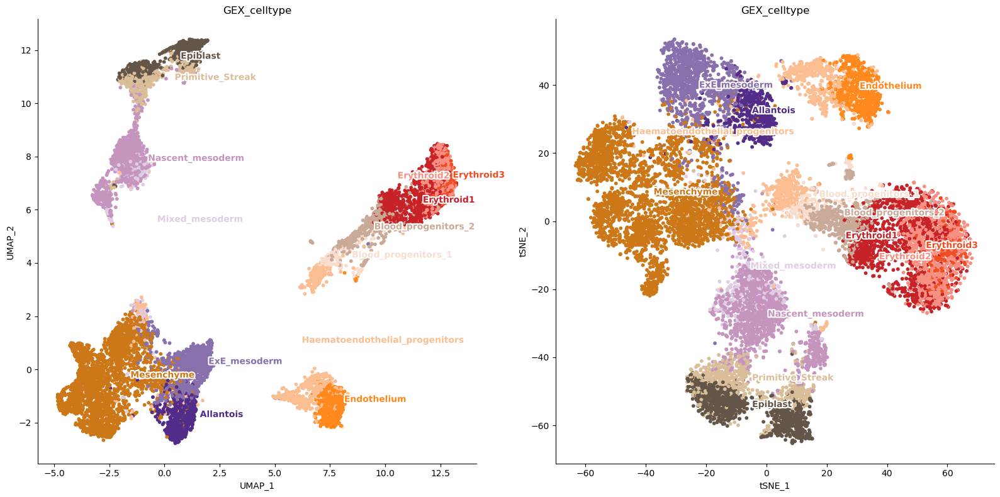

In [15]:
from scenicplus.dimensionality_reduction import plot_metadata_given_ax
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

#specify color_dictionary

color_dict_ct = {
	"Epiblast" : "#635547",
	"Primitive_Streak" : "#DABE99",
	"Caudal_epiblast" : "#9e6762",
	"PGC" : "#FACB12",
	"Anterior_Primitive_Streak" : "#c19f70",
	"Notochord" : "#0F4A9C",
	"Def._endoderm" : "#F397C0",
	"Gut" : "#EF5A9D",
	"Nascent_mesoderm" : "#C594BF",
	"Mixed_mesoderm" : "#DFCDE4",
	"Intermediate_mesoderm" : "#139992",
	"Caudal_Mesoderm" : "#3F84AA",
	"Paraxial_mesoderm" : "#8DB5CE",
	"Somitic_mesoderm" : "#005579",
	"Pharyngeal_mesoderm" : "#C9EBFB",
	"Cardiomyocytes" : "#B51D8D",
	"Allantois" : "#532C8A",
	"ExE_mesoderm" : "#8870ad",
	"Mesenchyme" : "#cc7818",
	"Haematoendothelial_progenitors" : "#FBBE92",
	"Endothelium" : "#ff891c",
	"Blood_progenitors" : "#c9a997",
	"Blood_progenitors_1" : "#f9decf",
	"Blood_progenitors_2" : "#c9a997",
	"Erythroid" : "#EF4E22",
	"Erythroid1" : "#C72228",
	"Erythroid2" : "#f79083",
	"Erythroid3" : "#EF4E22",
	"NMP" : "#8EC792",
	"Neurectoderm" : "#65A83E",
	"Rostral_neurectoderm" : "#65A83E",
	"Caudal_neurectoderm" : "#354E23",
	"Neural_crest" : "#C3C388",
	"Forebrain_Midbrain_Hindbrain" : "#647a4f",
	"Spinal_cord" : "#CDE088",
	"Surface_ectoderm" : "#f7f79e",
	"Visceral_endoderm" : "#F6BFCB",
	"ExE_endoderm" : "#7F6874",
	"ExE_ectoderm" : "#989898",
	"Parietal_endoderm" : "#1A1A1A"
}

fig, axs = plt.subplots(ncols=2, figsize = (16, 8))
plot_metadata_given_ax(
    scplus_obj=scplus_obj,
    ax = axs[0],
    reduction_name = 'eRegulons_UMAP',
    variable = 'GEX_celltype', #note the GEX_ prefix, this metadata originated from the gene expression metadata (on which we did the cell type annotation before)
    color_dictionary={'GEX_celltype': color_dict_ct}
)
plot_metadata_given_ax(
    scplus_obj=scplus_obj,
    ax = axs[1],
    reduction_name = 'eRegulons_tSNE',
    variable = 'GEX_celltype', #note the GEX_ prefix, this metadata originated from the gene expression metadata (on which we did the cell type annotation before)
    color_dictionary={'GEX_celltype': color_dict_ct}
)
fig.tight_layout()
sns.despine(ax = axs[0]) #remove top and right edge of axis border
sns.despine(ax = axs[1]) #remove top and right edge of axis border
plt.show()

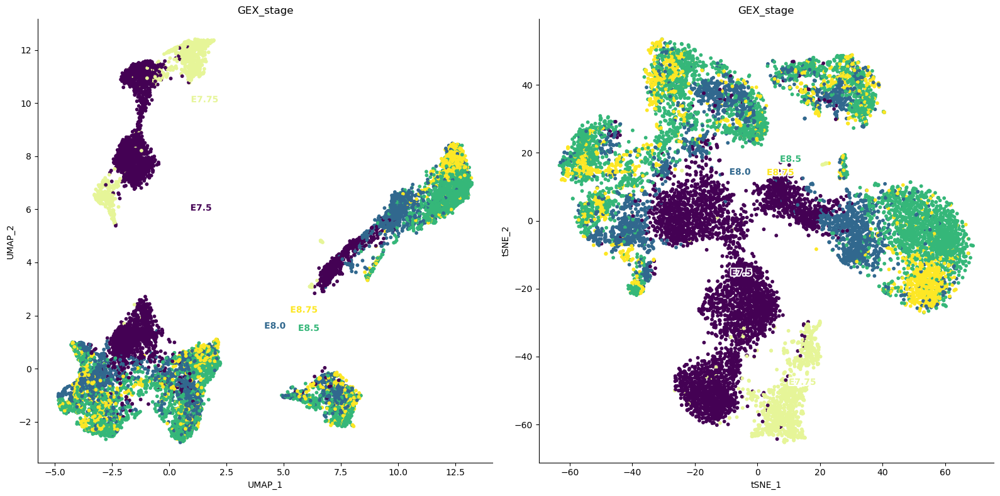

In [12]:
from scenicplus.dimensionality_reduction import plot_metadata_given_ax
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

#specify color_dictionary

color_dict_st = {
	'E7.5':"#440154FF",
	'E7.75':"#E6F598",
	'E8.0':"#31688EFF",
	'E8.5':"#35B779FF",
	'E8.75':"#FDE725FF"
}

fig, axs = plt.subplots(ncols=2, figsize = (16, 8))
plot_metadata_given_ax(
    scplus_obj=scplus_obj,
    ax = axs[0],
    reduction_name = 'eRegulons_UMAP',
    variable = 'GEX_stage', #note the GEX_ prefix, this metadata originated from the gene expression metadata (on which we did the cell type annotation before)
    color_dictionary={'GEX_stage': color_dict_st}
)
plot_metadata_given_ax(
    scplus_obj=scplus_obj,
    ax = axs[1],
    reduction_name = 'eRegulons_tSNE',
    variable = 'GEX_stage', #note the GEX_ prefix, this metadata originated from the gene expression metadata (on which we did the cell type annotation before)
    color_dictionary={'GEX_stage': color_dict_st}
)
fig.tight_layout()
sns.despine(ax = axs[0]) #remove top and right edge of axis border
sns.despine(ax = axs[1]) #remove top and right edge of axis border
plt.show()

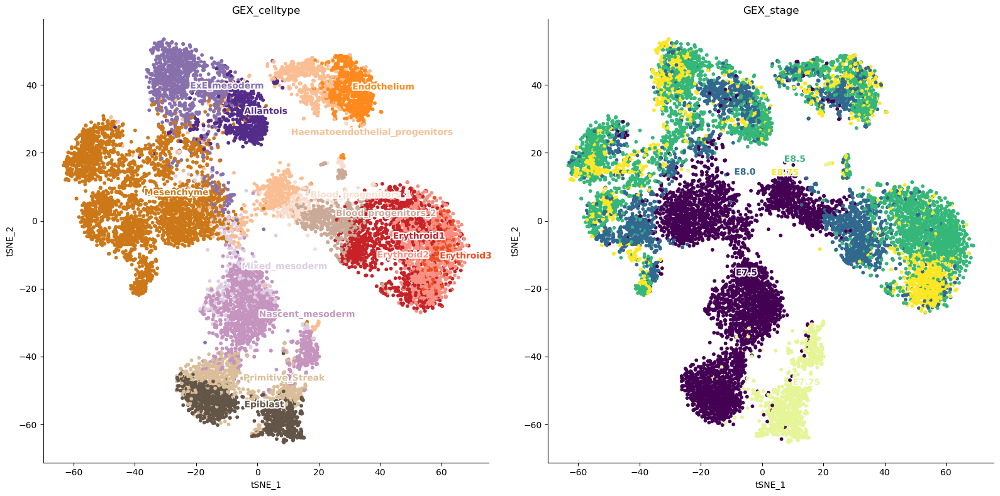

In [27]:
fig, axs = plt.subplots(ncols=2, figsize = (16, 8))
plot_metadata_given_ax(
    scplus_obj=scplus_obj,
    ax = axs[0],
    reduction_name = 'eRegulons_tSNE',
    variable = 'GEX_celltype', #note the GEX_ prefix, this metadata originated from the gene expression metadata (on which we did the cell type annotation before)
    color_dictionary={'GEX_celltype': color_dict_ct}
)
plot_metadata_given_ax(
    scplus_obj=scplus_obj,
    ax = axs[1],
    reduction_name = 'eRegulons_tSNE',
    variable = 'GEX_stage', #note the GEX_ prefix, this metadata originated from the gene expression metadata (on which we did the cell type annotation before)
    color_dictionary={'GEX_stage': color_dict_st}
)
fig.tight_layout()
sns.despine(ax = axs[0]) #remove top and right edge of axis border
sns.despine(ax = axs[1]) #remove top and right edge of axis border
plt.savefig('/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation_multiome/results/FYR_figures/scenic_tsne.pdf')

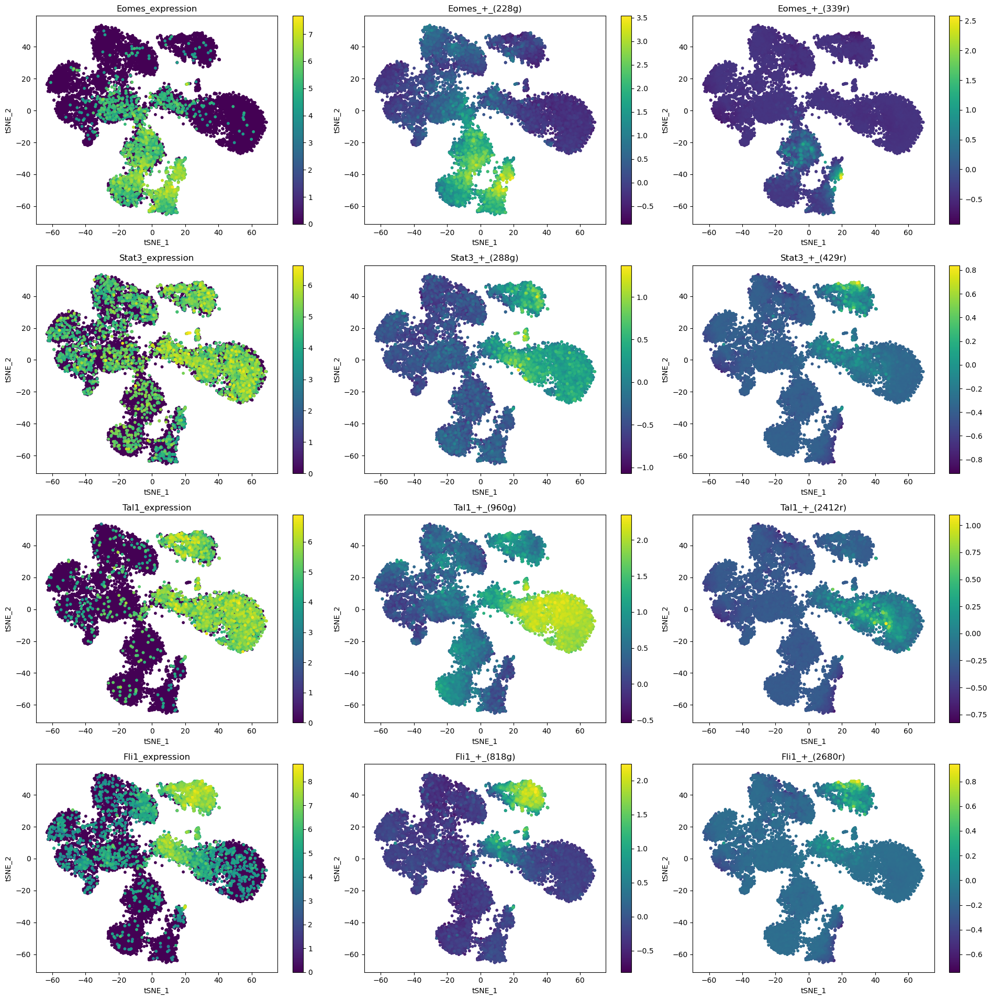

In [57]:
from scenicplus.dimensionality_reduction import plot_eRegulon
plot_eRegulon(
    scplus_obj = scplus_obj,
    reduction_name = 'eRegulons_tSNE',
    selected_regulons = ['Eomes_+', 'Stat3_+', 'Tal1_+', 'Fli1_+'],
    scale = True,
    auc_key = 'eRegulon_AUC_filtered',
    save='/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation_multiome/results/FYR_figures/scenic_plot_eRegulon.pdf')

### Filtering

In [30]:
from scenicplus.cistromes import TF_cistrome_correlation, generate_pseudobulks

generate_pseudobulks(
        scplus_obj = scplus_obj,
        variable = 'GEX_celltype',
        auc_key = 'eRegulon_AUC_filtered',
        signature_key = 'Gene_based')
generate_pseudobulks(
        scplus_obj = scplus_obj,
        variable = 'GEX_celltype',
        auc_key = 'eRegulon_AUC_filtered',
        signature_key = 'Region_based')

TF_cistrome_correlation(
            scplus_obj,
            use_pseudobulk = True,
            variable = 'GEX_celltype',
            auc_key = 'eRegulon_AUC_filtered',
            signature_key = 'Gene_based',
            out_key = 'filtered_gene_based')
TF_cistrome_correlation(
            scplus_obj,
            use_pseudobulk = True,
            variable = 'GEX_celltype',
            auc_key = 'eRegulon_AUC_filtered',
            signature_key = 'Region_based',
            out_key = 'filtered_region_based')

In [31]:
scplus_obj.uns['TF_cistrome_correlation']['filtered_region_based'].head()

,TF,Cistrome,Rho,P-value,Adjusted_p-value
0,Nr2f6,Nr2f6_extended_+_(36r),0.394923,1.808166e-53,4.000874e-53
1,Nkx2-5,Nkx2-5_extended_+_(24r),-0.015334,5.664560e-01,5.843818e-01
2,Erg,Erg_+_(2877r),0.897543,0.000000e+00,0.000000e+00
3,Atf7,Atf7_+_(80r),0.458076,1.487110e-73,3.973754e-73
4,Smad2,Smad2_+_(140r),0.281763,5.815249e-27,1.041633e-26


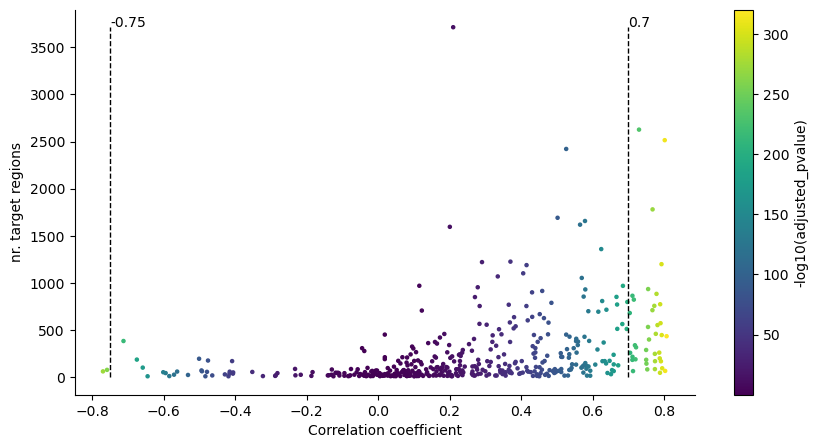

In [36]:
import numpy as np
n_targets = [int(x.split('(')[1].replace('r)', '')) for x in scplus_obj.uns['TF_cistrome_correlation']['filtered_region_based']['Cistrome']]
rho = scplus_obj.uns['TF_cistrome_correlation']['filtered_region_based']['Rho'].to_list()
adj_pval = scplus_obj.uns['TF_cistrome_correlation']['filtered_region_based']['Adjusted_p-value'].to_list()

thresholds = {
        'rho': [-0.75, 0.70],
        'n_targets': 0
}
import seaborn as sns
fig, ax = plt.subplots(figsize = (10, 5))
sc = ax.scatter(rho, n_targets, c = -np.log10(adj_pval), s = 5)
ax.set_xlabel('Correlation coefficient')
ax.set_ylabel('nr. target regions')
#ax.hlines(y = thresholds['n_targets'], xmin = min(rho), xmax = max(rho), color = 'black', ls = 'dashed', lw = 1)
ax.vlines(x = thresholds['rho'], ymin = 0, ymax = max(n_targets), color = 'black', ls = 'dashed', lw = 1)
ax.text(x = thresholds['rho'][0], y = max(n_targets), s = str(thresholds['rho'][0]))
ax.text(x = thresholds['rho'][1], y = max(n_targets), s = str(thresholds['rho'][1]))
sns.despine(ax = ax)
fig.colorbar(sc, label = '-log10(adjusted_pvalue)', ax = ax)
plt.savefig('/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation_multiome/results/FYR_figures/scenic_filter_TFs.pdf')

In [37]:
selected_cistromes = scplus_obj.uns['TF_cistrome_correlation']['filtered_region_based'].loc[
        np.logical_or(
                scplus_obj.uns['TF_cistrome_correlation']['filtered_region_based']['Rho'] > thresholds['rho'][1],
                scplus_obj.uns['TF_cistrome_correlation']['filtered_region_based']['Rho'] < thresholds['rho'][0]
        )]['Cistrome'].to_list()
selected_eRegulons = [x.split('_(')[0] for x in selected_cistromes]
selected_eRegulons_gene_sig = [
        x for x in scplus_obj.uns['eRegulon_signatures_filtered']['Gene_based'].keys()
        if x.split('_(')[0] in selected_eRegulons]
selected_eRegulons_region_sig = [
        x for x in scplus_obj.uns['eRegulon_signatures_filtered']['Region_based'].keys()
        if x.split('_(')[0] in selected_eRegulons]
#save the results in the scenicplus object
scplus_obj.uns['selected_eRegulon'] = {'Gene_based': selected_eRegulons_gene_sig, 'Region_based': selected_eRegulons_region_sig}
print(f'selected: {len(selected_eRegulons_gene_sig)} eRegulons')

selected: 78 eRegulons


In [38]:
pd.DataFrame(scplus_obj.uns['selected_eRegulon']['Gene_based']).to_csv(os.path.join(work_dir, 'scenicplus/eRegulon_to_keep.csv'), header=True, index=False)

In [40]:
dill.dump(scplus_obj, open(os.path.join(work_dir, 'scenicplus/scplus_obj_filt.pkl'), 'wb'), protocol=-1)

In [56]:
from scenicplus.plotting.dotplot import heatmap_dotplot
heatmap_dotplot(
        scplus_obj = scplus_obj,
        size_matrix = scplus_obj.uns['eRegulon_AUC_filtered']['Region_based'], #specify what to plot as dot sizes, target region enrichment in this case
        color_matrix = scplus_obj.to_df('EXP'), #specify  what to plot as colors, TF expression in this case
        scale_size_matrix = True,
        scale_color_matrix = True,
        group_variable = 'GEX_celltype',
        subset_eRegulons = scplus_obj.uns['selected_eRegulon']['Gene_based'],
        index_order = ["Epiblast",
                        "Primitive_Streak" ,
                        "Nascent_mesoderm",
                        "ExE_mesoderm",
                        "Mixed_mesoderm",
                        "Allantois",
                        "Mesenchyme",
                        "Haematoendothelial_progenitors",
                        "Endothelium",
                        "Blood_progenitors_1",
                        "Blood_progenitors_2",
                        "Erythroid1",
                        "Erythroid2",
                        "Erythroid3"],
        figsize = (5, 20),
        orientation = 'vertical',
        save='/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation_multiome/results/FYR_figures/scenic_RSS_dotplot.pdf')

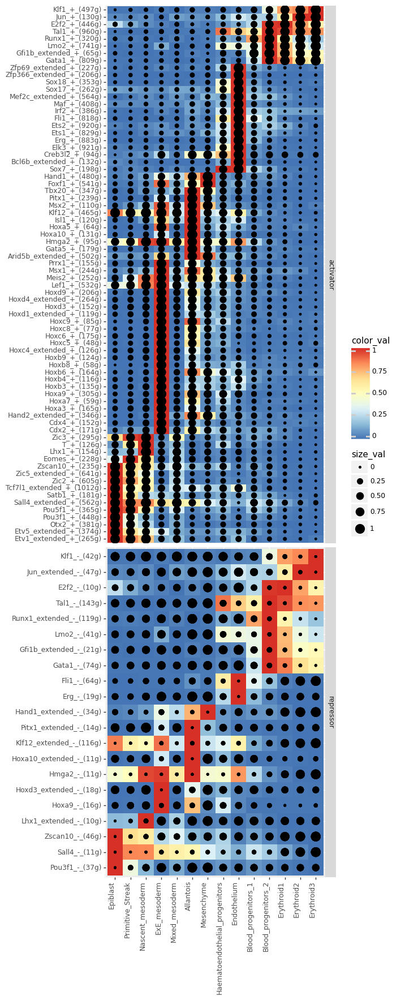

<ggplot: (2958848406679)>

In [24]:
from scenicplus.plotting.dotplot import heatmap_dotplot
heatmap_dotplot(
        scplus_obj = scplus_obj,
        size_matrix = scplus_obj.uns['eRegulon_AUC_filtered']['Gene_based'], #specify what to plot as dot sizes, target region enrichment in this case
        color_matrix = scplus_obj.to_df('EXP'), #specify  what to plot as colors, TF expression in this case
        scale_size_matrix = True,
        scale_color_matrix = True,
        group_variable = 'GEX_celltype',
        subset_eRegulons = scplus_obj.uns['selected_eRegulon']['Gene_based'],
        index_order = ["Epiblast",
                        "Primitive_Streak" ,
                        "Nascent_mesoderm",
                        "ExE_mesoderm",
                        "Mixed_mesoderm",
                        "Allantois",
                        "Mesenchyme",
                        "Haematoendothelial_progenitors",
                        "Endothelium",
                        "Blood_progenitors_1",
                        "Blood_progenitors_2",
                        "Erythroid1",
                        "Erythroid2",
                        "Erythroid3"],
        figsize = (5, 20),
        orientation = 'vertical')

In [42]:
from scenicplus.RSS import *
regulon_specificity_scores(
        scplus_obj,
        variable = 'GEX_celltype',
        auc_key = 'eRegulon_AUC_filtered',
        signature_keys = ['Region_based'],
        selected_regulons = [x for x in scplus_obj.uns['selected_eRegulon']['Region_based'] if '-' not in x],
        out_key_suffix = '_filtered')

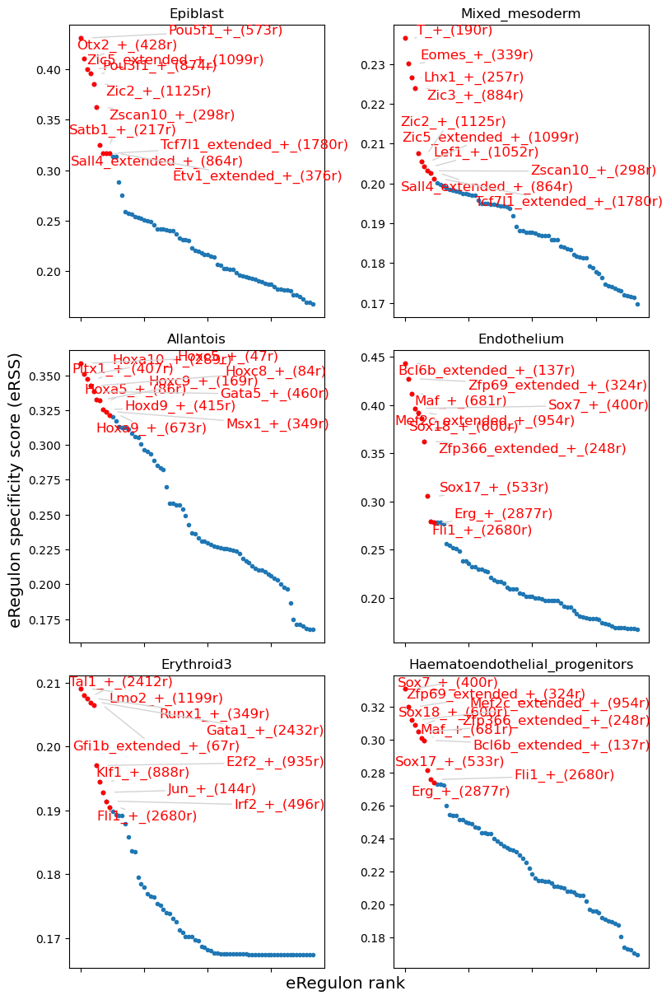

In [65]:
plot_rss(scplus_obj, 'GEX_celltype_filtered', 
         num_columns=2, 
         top_n=10, 
         figsize = (8, 12),
         selected_groups = ['Epiblast', 'Mixed_mesoderm', 'Allantois', 'Endothelium', 'Erythroid3', 'Haematoendothelial_progenitors'],
        save='/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation_multiome/results/FYR_figures/scenic_RSS.pdf')

In [29]:
flat_list = lambda t: [item for sublist in t for item in sublist]
selected_markers = list(set(flat_list(
    [scplus_obj.uns['RSS']['GEX_celltype_filtered'].loc[celltype].sort_values(ascending = False).head(10).index.to_list()
    for celltype in scplus_obj.uns['RSS']['GEX_celltype_filtered'].index])))

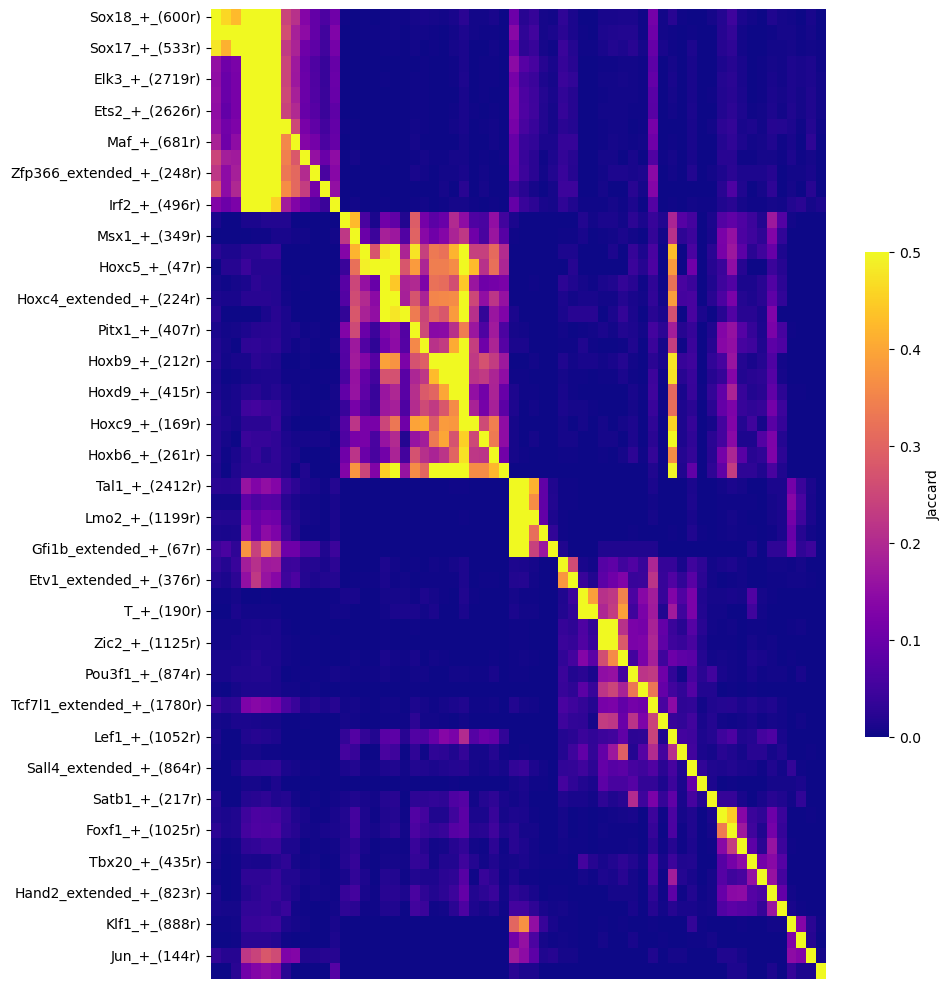

In [30]:
from scenicplus.plotting.correlation_plot import *

region_intersetc_data, Z = jaccard_heatmap(
        scplus_obj,
        method = 'intersect',
        gene_or_region_based = 'Region_based',
        use_plotly = False,
        selected_regulons = selected_markers,
        signature_key = 'eRegulon_signatures_filtered',
        figsize = (10, 10), return_data = True, vmax = 0.5, cmap = 'plasma')

In [126]:
jaccard_heatmap(scplus_obj,
                    gene_or_region_based = 'Gene_based',
                    signature_key = 'eRegulon_signatures',
                    selected_regulons = scplus_obj.uns['selected_eRegulon']['Gene_based'],
                    fcluster_threshold = 0.1,
                    fontsize = 3,
                    method='intersect')

KeyError: 'eRegulon_signature'

In [59]:
from pycisTopic.diff_features import find_highly_variable_features
hvr = find_highly_variable_features(scplus_obj.to_df('ACC').loc[list(set(scplus_obj.uns['eRegulon_metadata_filtered']['Region']))], n_top_features=1000, plot = False)
hvg = find_highly_variable_features(scplus_obj.to_df('EXP')[list(set(scplus_obj.uns['eRegulon_metadata_filtered']['Gene']))].T, n_top_features=1000, plot = False)

2022-09-18 19:47:15,695 cisTopic     INFO     Calculating mean
2022-09-18 19:47:15,935 cisTopic     INFO     Calculating variance
2022-09-18 19:47:18,514 cisTopic     INFO     Done!
2022-09-18 19:47:18,724 cisTopic     INFO     Calculating mean
2022-09-18 19:47:18,766 cisTopic     INFO     Calculating variance
2022-09-18 19:47:19,130 cisTopic     INFO     Done!


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

### Network!

In [117]:
from scenicplus.networks import create_nx_tables, create_nx_graph, plot_networkx, export_to_cytoscape
nx_tables = create_nx_tables(
    scplus_obj = scplus_obj,
    eRegulon_metadata_key ='eRegulon_metadata_filtered',
    subset_eRegulons = ['Gata1', 'Gata2', 'Tal1', 'Runx1'],
    subset_regions = hvr,
    subset_genes = hvg,
    add_differential_gene_expression = True,
    add_differential_region_accessibility = True,
    differential_variable = ['GEX_celltype'])

... storing 'GEX_celltype' as categorical
... storing 'GEX_celltype' as categorical
... storing 'GEX_celltype' as categorical


In [118]:
G, pos, edge_tables, node_tables = create_nx_graph(nx_tables,
                   use_edge_tables = ['TF2R','R2G'],
                   color_edge_by = {'TF2R': {'variable' : 'TF', 'category_color' : {'Gata1': 'Orange', 'Gata2': 'Purple', 'Tal1': 'Red', 'Runx1': 'Green'}},
                                    'R2G': {'variable' : 'R2G_rho', 'continuous_color' : 'viridis', 'v_min': -1, 'v_max': 1}},
                   transparency_edge_by =  {'R2G': {'variable' : 'R2G_importance', 'min_alpha': 0.1, 'v_min': 0}},
                   width_edge_by = {'R2G': {'variable' : 'R2G_importance', 'max_size' :  1.5, 'min_size' : 1}},
                   color_node_by = {'TF': {'variable': 'TF', 'category_color' : {'Gata1': 'Orange', 'Gata2': 'Purple', 'Tal1': 'Red', 'Runx1': 'Green'}},
                                    'Gene': {'variable': 'GEX_celltype_Log2FC_Erythroid3', 'continuous_color' : 'bwr'},
                                    'Region': {'variable': 'GEX_celltype_Log2FC_Erythroid3', 'continuous_color' : 'viridis'}},
                   transparency_node_by =  {'Region': {'variable' : 'GEX_celltype_Log2FC_Erythroid3', 'min_alpha': 0.1},
                                    'Gene': {'variable' : 'GEX_celltype_Log2FC_Erythroid3', 'min_alpha': 0.1}},
                   size_node_by = {'TF': {'variable': 'fixed_size', 'fixed_size': 30},
                                    'Gene': {'variable': 'fixed_size', 'fixed_size': 15},
                                    'Region': {'variable': 'fixed_size', 'fixed_size': 10}},
                   shape_node_by = {'TF': {'variable': 'fixed_shape', 'fixed_shape': 'ellipse'},
                                    'Gene': {'variable': 'fixed_shape', 'fixed_shape': 'ellipse'},
                                    'Region': {'variable': 'fixed_shape', 'fixed_shape': 'diamond'}},
                   label_size_by = {'TF': {'variable': 'fixed_label_size', 'fixed_label_size': 20.0},
                                    'Gene': {'variable': 'fixed_label_size', 'fixed_label_size': 10.0},
                                    'Region': {'variable': 'fixed_label_size', 'fixed_label_size': 0.0}},
                   layout='kamada_kawai_layout',
                   scale_position_by=250)

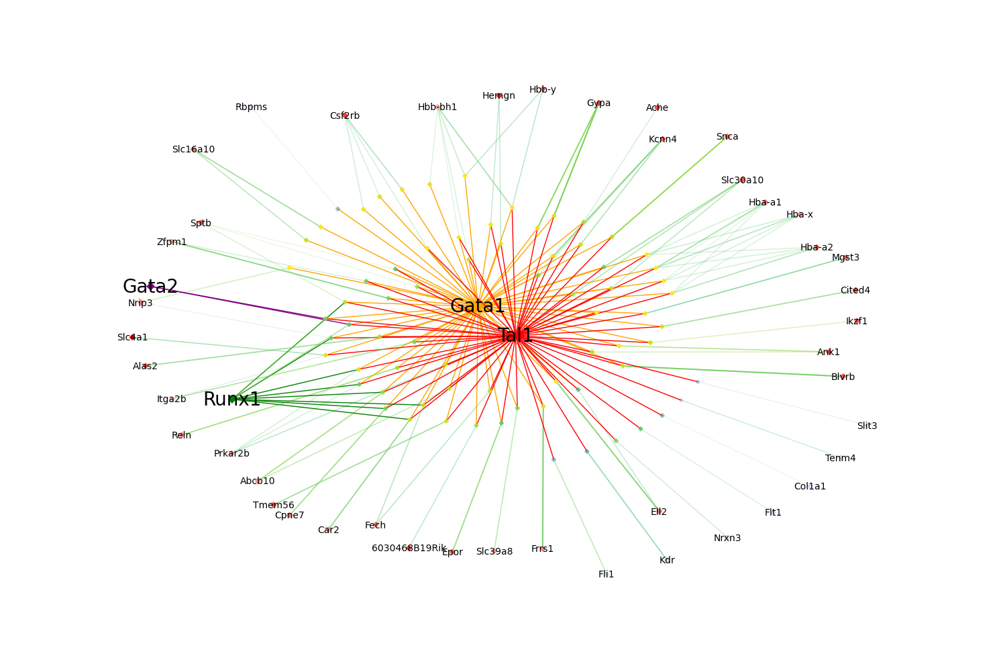

In [119]:
plt.figure(figsize=(15,10))
plot_networkx(G, pos)

In [139]:
from scenicplus.networks import create_nx_tables, create_nx_graph, plot_networkx, export_to_cytoscape
nx_tables = create_nx_tables(
    scplus_obj = scplus_obj,
    eRegulon_metadata_key ='eRegulon_metadata_filtered',
    subset_eRegulons = ['Gata1', 'Tal1', 'Runx1', 'Gfi1b', 'Lmo2', 'E2f2', 'Klf1', 'Erg', 'Fli1', 'Jun'],
    subset_regions = hvr,
    subset_genes = hvg,
    add_differential_gene_expression = True,
    add_differential_region_accessibility = True,
    differential_variable = ['GEX_celltype'])

G, pos, edge_tables, node_tables = create_nx_graph(nx_tables,
                   use_edge_tables = ['TF2R','R2G'],
                   color_edge_by = {'TF2R': {'variable' : 'TF', 'category_color' : {'Gata1': 'Orange', 'Tal1': 'Purple', 'Runx1': 'Red', 'Gfi1b': 'Green',
                                                                                   'Lmo2': 'Yellow', 'E2f2': 'Aqua', 'Klf1': 'Violet', 'Erg': 'Gray', 'Fli1': 'Bisque', 'Jun': 'Darkgreen'}},
                                    'R2G': {'variable' : 'R2G_rho', 'continuous_color' : 'viridis', 'v_min': -1, 'v_max': 1}},
                   transparency_edge_by =  {'R2G': {'variable' : 'R2G_importance', 'min_alpha': 0.1, 'v_min': 0}},
                   width_edge_by = {'R2G': {'variable' : 'R2G_importance', 'max_size' :  1.5, 'min_size' : 1}},
                   color_node_by = {'TF': {'variable': 'TF', 'category_color' : {'Gata1': 'Orange', 'Tal1': 'Purple', 'Runx1': 'Red', 'Gfi1b': 'Green',
                                                                                   'Lmo2': 'Yellow', 'E2f2': 'Aqua', 'Klf1': 'Violet', 'Erg': 'Gray', 'Fli1': 'Bisque', 'Jun': 'Darkgreen'}},
                                    'Gene': {'variable': 'GEX_celltype_Log2FC_Erythroid3', 'continuous_color' : 'bwr'},
                                    'Region': {'variable': 'GEX_celltype_Log2FC_Erythroid3', 'continuous_color' : 'viridis'}},
                   transparency_node_by =  {'Region': {'variable' : 'GEX_celltype_Log2FC_Erythroid3', 'min_alpha': 0.1},
                                    'Gene': {'variable' : 'GEX_celltype_Log2FC_Erythroid3', 'min_alpha': 0.1}},
                   size_node_by = {'TF': {'variable': 'fixed_size', 'fixed_size': 30},
                                    'Gene': {'variable': 'fixed_size', 'fixed_size': 15},
                                    'Region': {'variable': 'fixed_size', 'fixed_size': 10}},
                   shape_node_by = {'TF': {'variable': 'fixed_shape', 'fixed_shape': 'ellipse'},
                                    'Gene': {'variable': 'fixed_shape', 'fixed_shape': 'ellipse'},
                                    'Region': {'variable': 'fixed_shape', 'fixed_shape': 'diamond'}},
                   label_size_by = {'TF': {'variable': 'fixed_label_size', 'fixed_label_size': 20.0},
                                    'Gene': {'variable': 'fixed_label_size', 'fixed_label_size': 10.0},
                                    'Region': {'variable': 'fixed_label_size', 'fixed_label_size': 0.0}},
                   layout='kamada_kawai_layout',
                   scale_position_by=600)

... storing 'GEX_celltype' as categorical
... storing 'GEX_celltype' as categorical
... storing 'GEX_celltype' as categorical


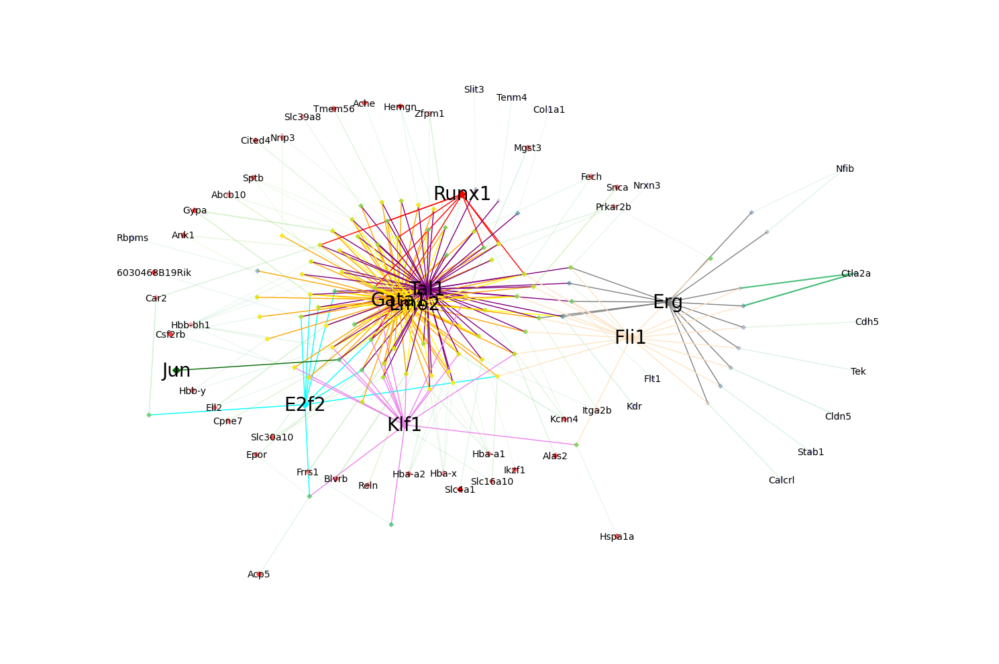

In [140]:
plt.figure(figsize=(15,10))
plot_networkx(G, pos)

In [145]:
export_to_cytoscape(G, pos, out_file = os.path.join(work_dir, 'scenicplus/network_Erythroid.cyjs'), pos_scaling_factor = 400, size_scaling_factor = 1)
## in cytoscape follow this: 
# Select Layout → Bundle Edges → All Nodes and Edges.
# Set parameters.
# Details of the algorithm is described in this paper.
# Press OK to run. Edge bundling may take a long time if the number of edges is large.
# If it takes too long, try decreasing Maximum Iterations.
# For large, dense networks, try setting Maximum iterations in the range of 500 - 1000.

In [155]:
from scenicplus.networks import create_nx_tables, create_nx_graph, plot_networkx, export_to_cytoscape
nx_tables = create_nx_tables(
    scplus_obj = scplus_obj,
    eRegulon_metadata_key ='eRegulon_metadata_filtered_manual',
    subset_eRegulons = ['Gata1', 'Tal1', 'Runx1', 'Gfi1b', 'Lmo2', 'E2f2', 'Klf1', 'Erg', 'Fli1', 'Jun'],
  #  subset_regions = hvr,
  #  subset_genes = hvg,
    add_differential_gene_expression = True,
    add_differential_region_accessibility = True,
    differential_variable = ['GEX_celltype'])

... storing 'GEX_celltype' as categorical
... storing 'GEX_celltype' as categorical
... storing 'GEX_celltype' as categorical


In [168]:
# Manual filtering
network = scplus_obj.uns['eRegulon_metadata_filtered'].copy()
network_filt = network.loc[(network['R2G_rho'] >= 0.25) & (network['TF2G_rho'] >= 0.25)]
scplus_obj.uns['eRegulon_metadata_filtered_manual'] = network_filt

In [175]:
nx_tables = create_nx_tables(
    scplus_obj = scplus_obj,
    eRegulon_metadata_key ='eRegulon_metadata_filtered_manual',
    subset_eRegulons = ['Gata1', 'Tal1', 'Runx1', 'Gfi1b', 'Lmo2', 'E2f2', 'Klf1', 'Erg', 'Fli1', 'Jun'],
#    subset_regions = hvr,
#    subset_genes = hvg,
    add_differential_gene_expression = True,
    add_differential_region_accessibility = True,
    differential_variable = ['GEX_celltype'])

... storing 'GEX_celltype' as categorical
... storing 'GEX_celltype' as categorical
... storing 'GEX_celltype' as categorical


In [176]:

G, pos, edge_tables, node_tables = create_nx_graph(nx_tables,
                   use_edge_tables = ['TF2R','R2G'],
                   color_edge_by = {'TF2R': {'variable' : 'TF', 'category_color' : {'Gata1': 'Orange', 'Tal1': 'Purple', 'Runx1': 'Red', 'Gfi1b': 'Green',
                                                                                   'Lmo2': 'Yellow', 'E2f2': 'Aqua', 'Klf1': 'Violet', 'Erg': 'Gray', 'Fli1': 'Bisque', 'Jun': 'Darkgreen'}},
                                    'R2G': {'variable' : 'R2G_rho', 'continuous_color' : 'viridis', 'v_min': -1, 'v_max': 1}},
                   transparency_edge_by =  {'R2G': {'variable' : 'R2G_importance', 'min_alpha': 0.1, 'v_min': 0}},
                   width_edge_by = {'R2G': {'variable' : 'R2G_importance', 'max_size' :  1.5, 'min_size' : 1}},
                   color_node_by = {'TF': {'variable': 'TF', 'category_color' : {'Gata1': 'Orange', 'Tal1': 'Purple', 'Runx1': 'Red', 'Gfi1b': 'Green',
                                                                                   'Lmo2': 'Yellow', 'E2f2': 'Aqua', 'Klf1': 'Violet', 'Erg': 'Gray', 'Fli1': 'Bisque', 'Jun': 'Darkgreen'}},
                                    'Gene': {'variable': 'GEX_celltype_Log2FC_Erythroid3', 'continuous_color' : 'bwr'},
                                    'Region': {'variable': 'GEX_celltype_Log2FC_Erythroid3', 'continuous_color' : 'viridis'}},
                   transparency_node_by =  {'Region': {'variable' : 'GEX_celltype_Log2FC_Erythroid3', 'min_alpha': 0.1},
                                    'Gene': {'variable' : 'GEX_celltype_Log2FC_Erythroid3', 'min_alpha': 0.1}},
                   size_node_by = {'TF': {'variable': 'fixed_size', 'fixed_size': 30},
                                    'Gene': {'variable': 'fixed_size', 'fixed_size': 15},
                                    'Region': {'variable': 'fixed_size', 'fixed_size': 10}},
                   shape_node_by = {'TF': {'variable': 'fixed_shape', 'fixed_shape': 'ellipse'},
                                    'Gene': {'variable': 'fixed_shape', 'fixed_shape': 'ellipse'},
                                    'Region': {'variable': 'fixed_shape', 'fixed_shape': 'diamond'}},
                   label_size_by = {'TF': {'variable': 'fixed_label_size', 'fixed_label_size': 20.0},
                                    'Gene': {'variable': 'fixed_label_size', 'fixed_label_size': 10.0},
                                    'Region': {'variable': 'fixed_label_size', 'fixed_label_size': 0.0}},
                   layout='kamada_kawai_layout',
                   scale_position_by=500)


In [177]:
export_to_cytoscape(G, pos, out_file = os.path.join(work_dir, 'scenicplus/network_Erythroid_big.cyjs'), pos_scaling_factor = 400, size_scaling_factor = 1)

In [265]:
network_filt = network.loc[(network['TF2G_rho'] >= 0.55)]
#vc = network_filt['TF'].value_counts()
#network_filt = network_filt[network_filt['TF'].isin(vc[vc >= 3].index)]. # keep only the ones that appear >= 3 times, doesn't work somehow
network_filt = network_filt.loc[(network_filt['TF'].isin(network_filt['Gene']))]
network_filt = network_filt.loc[(network_filt['Gene'].isin(network_filt['TF']))]
scplus_obj.uns['eRegulon_metadata_filtered_TFs'] = network_filt

In [294]:
nx_tables = create_nx_tables(
    scplus_obj = scplus_obj,
    eRegulon_metadata_key ='eRegulon_metadata_filtered_TFs',
  #  subset_eRegulons =  network_filt['TF'].unique().tolist(),
    subset_regions = hvr,
    subset_genes = hvg,
   # add_differential_gene_expression = True,
  #  add_differential_region_accessibility = True,
    differential_variable = ['GEX_celltype'])

In [297]:
def get_N_HexCol(N=5):
    HSV_tuples = [(x * 1.0 / N, 0.5, 0.5) for x in range(N)]
    hex_out = []
    for rgb in HSV_tuples:
        rgb = map(lambda x: int(x * 255), colorsys.hsv_to_rgb(*rgb))
        hex_out.append('#%02x%02x%02x' % tuple(rgb))
    return hex_out

In [298]:
colors = get_N_HexCol(N = len(network_filt['TF'].unique().tolist()))
TFs = network_filt['TF'].unique().tolist()

In [299]:
col_dict = {TFs[i]: colors[i] for i in range(len(TFs))}

In [302]:
nx_tables

{'Edge': {'TF2R':         TF                   Region Consensus_name Gene_signature_name  \
  230   Elk3   chr9:32582039-32582639       Elk3_+_+       Elk3_+_(921g)   
  305    Erg   chr9:32582039-32582639        Erg_+_+        Erg_+_(883g)   
  264   Fli1   chr9:32582039-32582639       Fli1_+_+       Fli1_+_(818g)   
  127  Runx1  chr16:92801439-92802039      Runx1_+_+      Runx1_+_(320g)   
  128  Runx1  chr16:92822085-92822685      Runx1_+_+      Runx1_+_(320g)   
  
      Region_signature_name is_extended  
  230        Elk3_+_(2719r)       False  
  305         Erg_+_(2877r)       False  
  264        Fli1_+_(2680r)       False  
  127        Runx1_+_(349r)       False  
  128        Runx1_+_(349r)       False  ,
  'R2G':                       Region   Gene Consensus_name Gene_signature_name  \
  230   chr9:32582039-32582639   Fli1       Elk3_+_+       Elk3_+_(921g)   
  305   chr9:32582039-32582639   Fli1        Erg_+_+        Erg_+_(883g)   
  264   chr9:32582039-32582639   Fli1

In [304]:

G, pos, edge_tables, node_tables = create_nx_graph(nx_tables,
                   use_edge_tables = ['TF2R','R2G'],
                   color_edge_by = {'TF2R': {'variable' : 'TF', 'category_color' : col_dict},
                                    'R2G': {'variable' : 'R2G_rho', 'continuous_color' : 'viridis', 'v_min': -1, 'v_max': 1}},
                   transparency_edge_by =  {'R2G': {'variable' : 'R2G_importance', 'min_alpha': 0.1, 'v_min': 0}},
                   width_edge_by = {'R2G': {'variable' : 'R2G_importance', 'max_size' :  1.5, 'min_size' : 1}},
                   color_node_by = {'TF': {'variable': 'TF', 'category_color' : col_dict},
                                    'Gene': {'variable': 'Node_type', 'continuous_color' : 'bwr'},
                                    'Region': {'variable': 'Node_type', 'continuous_color' : 'viridis'}},
                   transparency_node_by =  {'Region': {'variable' : 'Node_type', 'min_alpha': 0.1},
                                    'Gene': {'variable' : 'Node_type', 'min_alpha': 0.1}},
                   size_node_by = {'TF': {'variable': 'fixed_size', 'fixed_size': 30},
                                    'Gene': {'variable': 'fixed_size', 'fixed_size': 15},
                                    'Region': {'variable': 'fixed_size', 'fixed_size': 10}},
                   shape_node_by = {'TF': {'variable': 'fixed_shape', 'fixed_shape': 'ellipse'},
                                    'Gene': {'variable': 'fixed_shape', 'fixed_shape': 'ellipse'},
                                    'Region': {'variable': 'fixed_shape', 'fixed_shape': 'diamond'}},
                   label_size_by = {'TF': {'variable': 'fixed_label_size', 'fixed_label_size': 20.0},
                                    'Gene': {'variable': 'fixed_label_size', 'fixed_label_size': 10.0},
                                    'Region': {'variable': 'fixed_label_size', 'fixed_label_size': 0.0}},
                   layout='kamada_kawai_layout',
                   scale_position_by=500)


AttributeError: 'str' object has no attribute 'view'

### Interactions

To-do, uses bigwig generated via pycistopic. also possible via ones from Archr?

In [ ]:
# # Generate interaction and annotation pyranges
# import matplotlib.pyplot as plt
# import os
# from scenicplus.utils import get_interaction_pr
# import pyranges as pr
# bigwig_dir = '/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/10x_multiome_brain/output/atac/pycistopic/consensus_peak_calling/seurat_pseudobulk_bw_files/'
# bw_dict = {x.replace('.bw', ''): os.path.join(bigwig_dir, x) for x in os.listdir(bigwig_dir) if '.bw' in x}
# pr_consensus_bed = pr.read_bed('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/10x_multiome_brain/output/atac/pycistopic/consensus_peak_calling/consensus_regions.bed')
# pr_interact = get_interaction_pr(scplus_obj, 'hsapiens', 'hg38', inplace = False, subset_for_eRegulons_regions = True, eRegulons_key = 'eRegulons_importance')
# gtf_file = "/lustre1/project/stg_00002/lcb/fderop/data/00000000_genomes/GRCh38_STAR_2.7.5_rna/genes.gtf"
# pr_gtf = pr.read_gtf(gtf_file)

### Perturbation simulation

I think they may be ran on eRegulon_metadata rather than filtered version?

To-do:
run on filtered GRN
Run regression only once and then plot for all genes of interest

https://github.com/aertslab/scenicplus/blob/main/src/scenicplus/simulation.py
https://scenicplus.readthedocs.io/en/latest/Perturbation_simulation.html

In [60]:
from scenicplus.dimensionality_reduction import run_eRegulons_pca
run_eRegulons_pca(
        scplus_obj,
        auc_key = 'eRegulon_AUC_filtered',
        reduction_name = 'eRegulons_PCA_gene_based',
        selected_regulons = scplus_obj.uns['selected_eRegulon']['Gene_based'])

In [61]:
from pycisTopic.diff_features import find_highly_variable_features
hvg = find_highly_variable_features(scplus_obj.to_df('EXP')[list(set(scplus_obj.uns['eRegulon_metadata_filtered']['Gene']))].T, n_top_features = 200, plot = False)

2022-09-18 19:47:39,178 cisTopic     INFO     Calculating mean
2022-09-18 19:47:39,220 cisTopic     INFO     Calculating variance
2022-09-18 19:47:44,325 cisTopic     INFO     Done!


<Figure size 640x480 with 0 Axes>

In [62]:
color_dict_line = {
   "Epiblast" : "#635547",
	"Primitive_Streak" : "#DABE99",
	"Caudal_epiblast" : "#9e6762",
	"PGC" : "#FACB12",
	"Anterior_Primitive_Streak" : "#c19f70",
	"Notochord" : "#0F4A9C",
	"Def._endoderm" : "#F397C0",
	"Gut" : "#EF5A9D",
	"Nascent_mesoderm" : "#C594BF",
	"Mixed_mesoderm" : "#DFCDE4",
	"Intermediate_mesoderm" : "#139992",
	"Caudal_Mesoderm" : "#3F84AA",
	"Paraxial_mesoderm" : "#8DB5CE",
	"Somitic_mesoderm" : "#005579",
	"Pharyngeal_mesoderm" : "#C9EBFB",
	"Cardiomyocytes" : "#B51D8D",
	"Allantois" : "#532C8A",
	"ExE_mesoderm" : "#8870ad",
	"Mesenchyme" : "#cc7818",
	"Haematoendothelial_progenitors" : "#FBBE92",
	"Endothelium" : "#ff891c",
	"Blood_progenitors" : "#c9a997",
	"Blood_progenitors_1" : "#f9decf",
	"Blood_progenitors_2" : "#c9a997",
	"Erythroid" : "#EF4E22",
	"Erythroid1" : "#C72228",
	"Erythroid2" : "#f79083",
	"Erythroid3" : "#EF4E22",
	"NMP" : "#8EC792",
	"Neurectoderm" : "#65A83E",
	"Rostral_neurectoderm" : "#65A83E",
	"Caudal_neurectoderm" : "#354E23",
	"Neural_crest" : "#C3C388",
	"Forebrain_Midbrain_Hindbrain" : "#647a4f",
	"Spinal_cord" : "#CDE088",
	"Surface_ectoderm" : "#f7f79e",
	"Visceral_endoderm" : "#F6BFCB",
	"ExE_endoderm" : "#7F6874",
	"ExE_ectoderm" : "#989898",
	"Parietal_endoderm" : "#1A1A1A"}


In [63]:
scplus_obj

SCENIC+ object with n_cells x n_genes = 12686 x 32285 and n_cells x n_regions = 12686 x 120828
	metadata_regions:'Chromosome', 'Start', 'End', 'Width', 'cisTopic_nr_frag', 'cisTopic_log_nr_frag', 'cisTopic_nr_acc', 'cisTopic_log_nr_acc'
	metadata_genes:'gene'
	metadata_cell:'GEX_barcode', 'GEX_sample', 'GEX_nFeature_RNA', 'GEX_nCount_RNA', 'GEX_mitochondrial_percent_RNA', 'GEX_ribosomal_percent_RNA', 'GEX_stage', 'GEX_genotype', 'GEX_pass_rnaQC', 'GEX_doublet_score', 'GEX_doublet_call', 'GEX_celltype', 'GEX_celltype.score', 'GEX_closest.cell', 'GEX_n_genes_by_counts', 'GEX_total_counts', 'GEX_total_counts_mt', 'GEX_pct_counts_mt', 'ACC_cisTopic_log_nr_acc', 'ACC_cisTopic_nr_frag', 'ACC_cisTopic_nr_acc', 'ACC_cell', 'ACC_sample_id', 'ACC_cisTopic_log_nr_frag', 'ACC_barcode', 'ACC_sample', 'ACC_nFeature_RNA', 'ACC_nCount_RNA', 'ACC_mitochondrial_percent_RNA', 'ACC_ribosomal_percent_RNA', 'ACC_stage', 'ACC_genotype', 'ACC_pass_rnaQC', 'ACC_doublet_score', 'ACC_doublet_call', 'ACC_celltype

2022-09-18 19:47:57,939 perturbation INFO     Caclulating perturbation matrix for: {'Stat3': 0} over 5 iterations.


100%|██████████| 200/200 [02:02<00:00,  1.63it/s]


2022-09-18 19:51:58,924 perturbation INFO     Generating ranking based on perturbed matrix.
2022-09-18 19:52:41,881 perturbation INFO     Scoring eRegulons.
2022-09-18 19:53:01,426 perturbation INFO     Projecting perturbation effect in embedding: eRegulons_tSNE
2022-09-18 19:53:38,880 perturbation INFO     Calculating grid of arrows
2022-09-18 19:53:38,960 perturbation INFO     Plotting


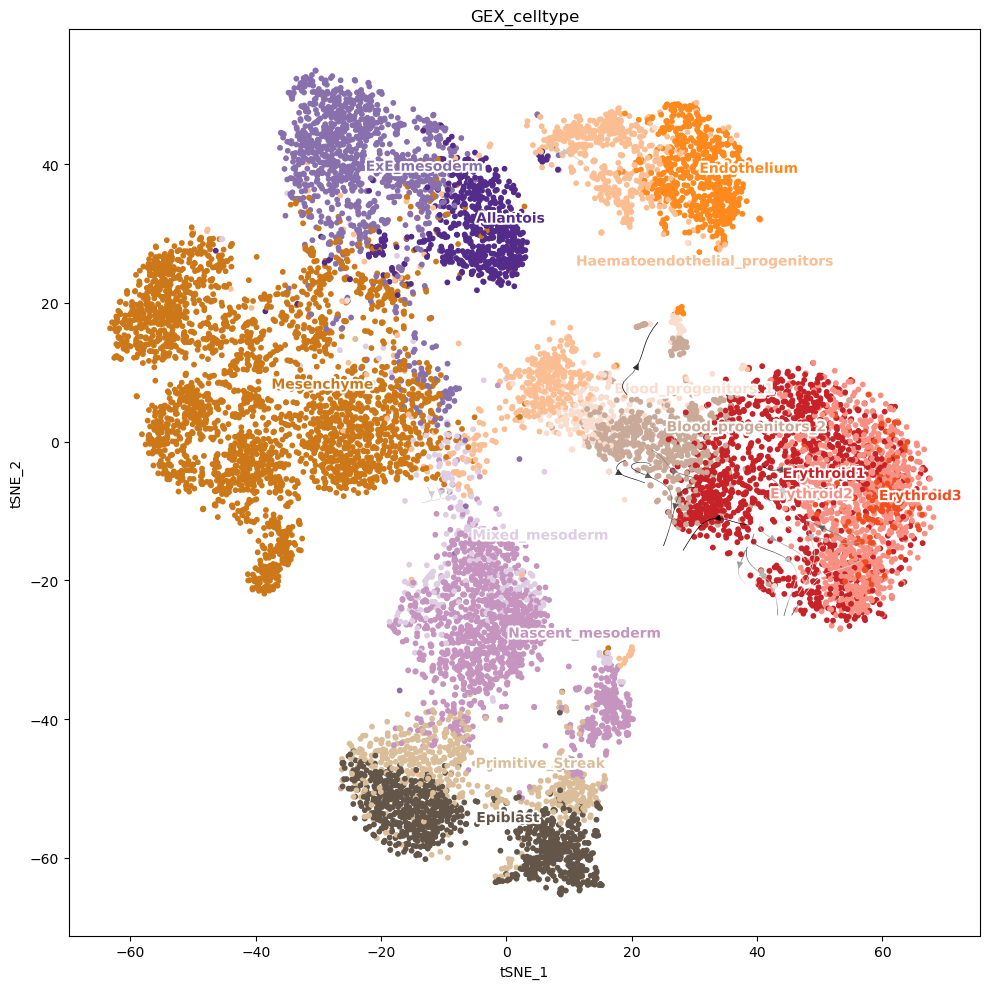

In [64]:
# Now in UMAP embedding

from scenicplus.simulation import plot_perturbation_effect_in_embedding
import seaborn as sns
_ = plot_perturbation_effect_in_embedding(
        scplus_obj = scplus_obj,
        reduction_name = 'eRegulons_tSNE',
        n_cpu = 15,
        perturbation = {'Stat3': 0}, #specifies that we want to set the expression of SOX10 to 0 in all cells.
        variable = 'GEX_celltype',
        color_dictionary = {'GEX_celltype': color_dict_line},
        genes_to_use = hvg,
        figsize = (10, 10),
        save='/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation_multiome/results/FYR_figures/scenic_pertur_sim_Stat3.pdf')

2022-09-18 19:33:54,215 perturbation INFO     Caclulating perturbation matrix for: {'Sox7': 0} over 5 iterations.


100%|██████████| 200/200 [02:04<00:00,  1.61it/s]


2022-09-18 19:37:59,535 perturbation INFO     Generating ranking based on perturbed matrix.
2022-09-18 19:38:42,281 perturbation INFO     Scoring eRegulons.
2022-09-18 19:39:01,708 perturbation INFO     Projecting perturbation effect in embedding: eRegulons_tSNE
2022-09-18 19:39:40,893 perturbation INFO     Calculating grid of arrows
2022-09-18 19:39:40,969 perturbation INFO     Plotting


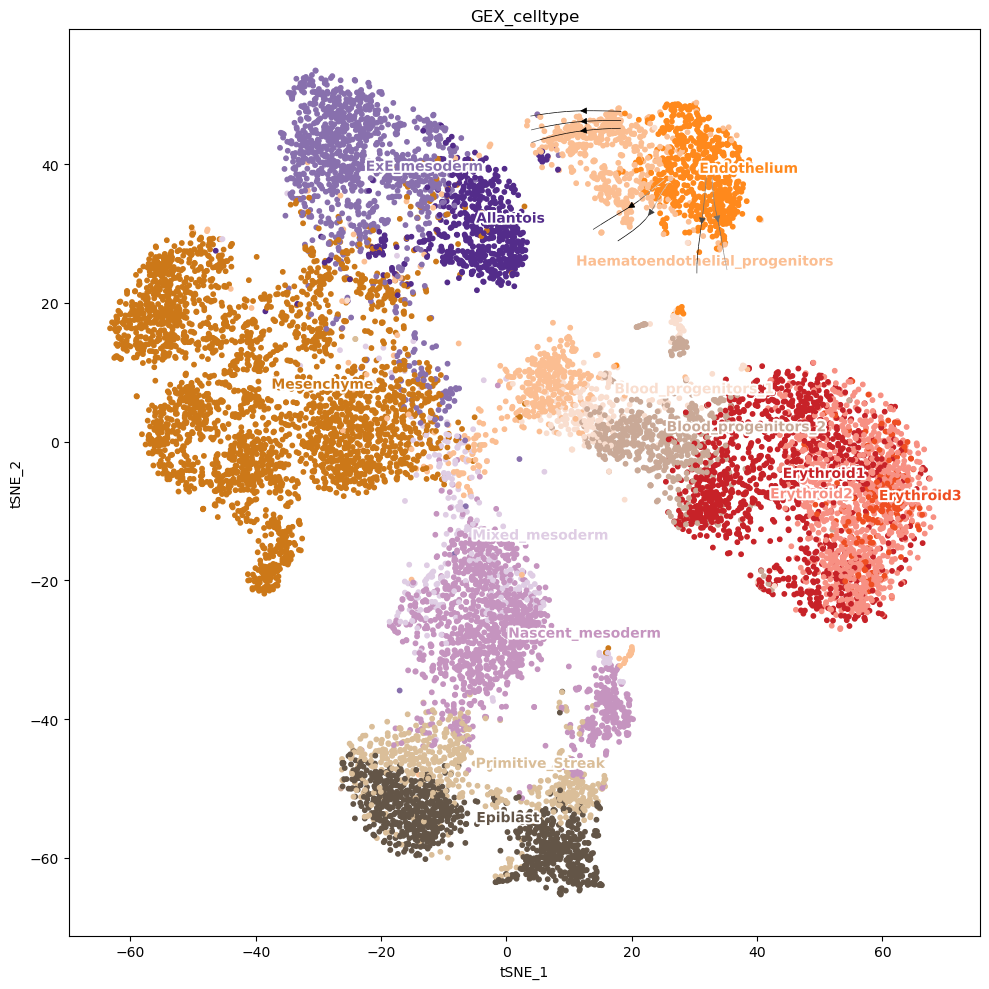

In [54]:
_ = plot_perturbation_effect_in_embedding(
        scplus_obj = scplus_obj,
        reduction_name = 'eRegulons_tSNE',
        n_cpu = 15,
        perturbation = {'Sox7': 0}, #specifies that we want to set the expression of SOX10 to 0 in all cells.
        variable = 'GEX_celltype',
        color_dictionary = {'GEX_celltype': color_dict_line},
        genes_to_use = hvg,
        figsize = (10, 10),
        save='/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation_multiome/results/FYR_figures/scenic_pertur_sim_Sox7.pdf')

2022-09-18 19:39:45,424 perturbation INFO     Caclulating perturbation matrix for: {'Tal1': 0} over 5 iterations.


100%|██████████| 200/200 [02:02<00:00,  1.63it/s]


2022-09-18 19:43:54,956 perturbation INFO     Generating ranking based on perturbed matrix.
2022-09-18 19:44:37,813 perturbation INFO     Scoring eRegulons.
2022-09-18 19:44:57,229 perturbation INFO     Projecting perturbation effect in embedding: eRegulons_tSNE
2022-09-18 19:45:35,427 perturbation INFO     Calculating grid of arrows
2022-09-18 19:45:35,507 perturbation INFO     Plotting
2022-09-18 19:45:39,751 perturbation INFO     Caclulating perturbation matrix for: {'Fli1': 0} over 5 iterations.


  6%|▋         | 13/200 [00:09<02:18,  1.35it/s]

KeyboardInterrupt



Error in callback <function install_repl_displayhook.<locals>.post_execute at 0x2ab1f1745280> (for post_execute):



KeyboardInterrupt



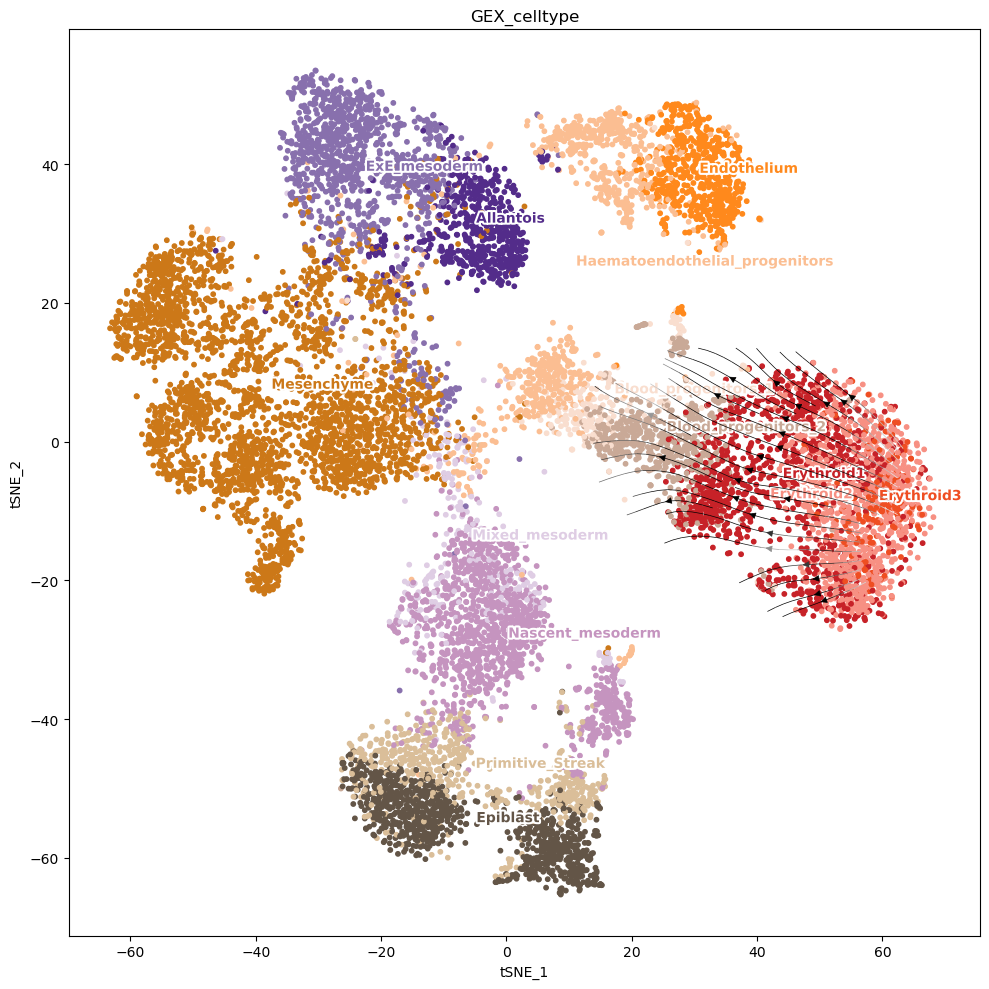

In [55]:
_ = plot_perturbation_effect_in_embedding(
        scplus_obj = scplus_obj,
        reduction_name = 'eRegulons_tSNE',
        n_cpu = 15,
        perturbation = {'Tal1': 0}, #specifies that we want to set the expression of SOX10 to 0 in all cells.
        variable = 'GEX_celltype',
        color_dictionary = {'GEX_celltype': color_dict_line},
        genes_to_use = hvg,
        figsize = (10, 10),
        save='/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation_multiome/results/FYR_figures/scenic_pertur_sim_Tal1.pdf')

_ = plot_perturbation_effect_in_embedding(
        scplus_obj = scplus_obj,
        reduction_name = 'eRegulons_tSNE',
        n_cpu = 15,
        perturbation = {'Fli1': 0}, #specifies that we want to set the expression of SOX10 to 0 in all cells.
        variable = 'GEX_celltype',
        color_dictionary = {'GEX_celltype': color_dict_line},
        genes_to_use = hvg,
        figsize = (10, 10),
        save='/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation_multiome/results/FYR_figures/scenic_pertur_sim_Fli1.pdf')

2022-08-29 14:00:37,315 perturbation INFO     Caclulating perturbation matrix for: {'Eomes': 0} over 5 iterations.


100%|██████████| 200/200 [04:58<00:00,  1.49s/it]


2022-08-29 14:09:06,660 perturbation INFO     Generating ranking based on perturbed matrix.
2022-08-29 14:09:52,358 perturbation INFO     Scoring eRegulons.
2022-08-29 14:10:11,572 perturbation INFO     Projecting perturbation effect in embedding: eRegulons_tSNE
2022-08-29 14:10:45,528 perturbation INFO     Calculating grid of arrows
2022-08-29 14:10:45,619 perturbation INFO     Plotting


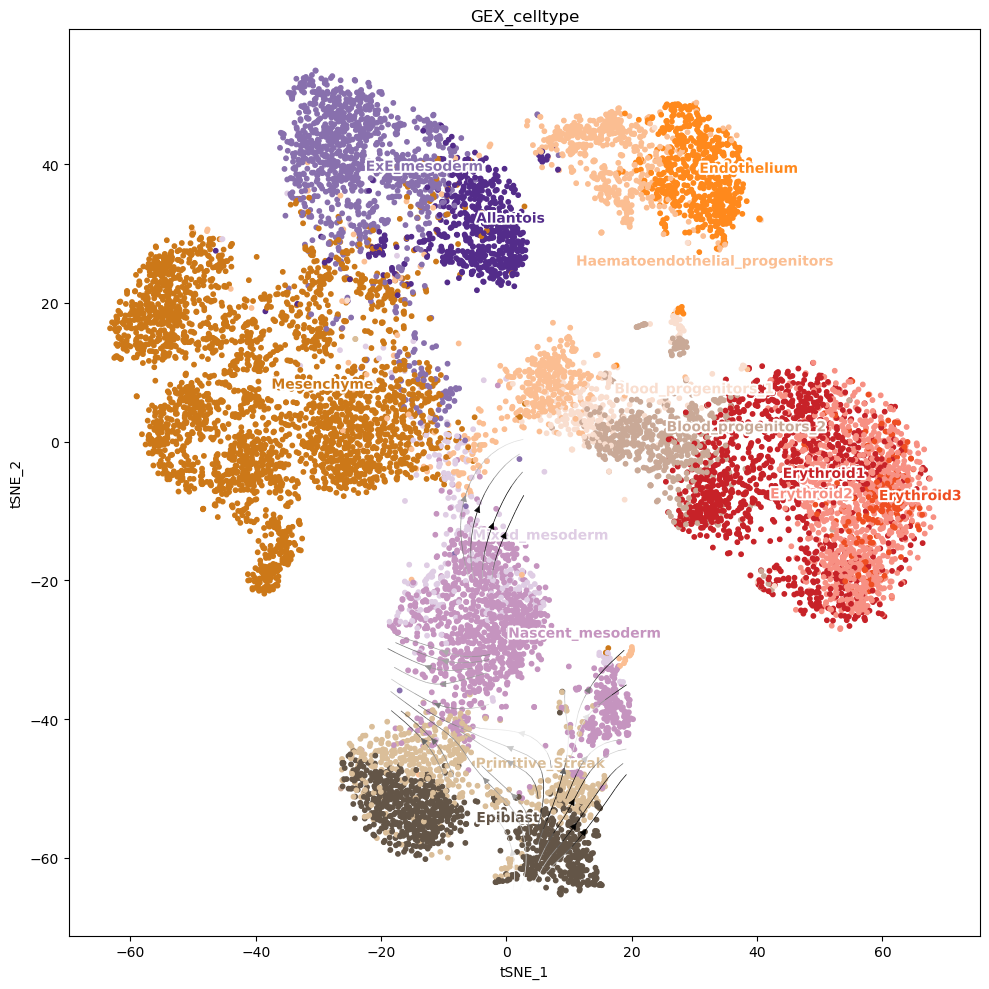

In [107]:
_ = plot_perturbation_effect_in_embedding(
        scplus_obj = scplus_obj,
        reduction_name = 'eRegulons_tSNE',
        n_cpu = 30,
        perturbation = {'Eomes': 0}, #specifies that we want to set the expression of SOX10 to 0 in all cells.
        variable = 'GEX_celltype',
        color_dictionary = {'GEX_celltype': color_dict_line},
        genes_to_use = hvg,
        figsize = (10, 10))

2022-08-29 14:10:49,495 perturbation INFO     Caclulating perturbation matrix for: {'Runx1': 0} over 5 iterations.


100%|██████████| 200/200 [04:57<00:00,  1.49s/it]


2022-08-29 14:18:18,876 perturbation INFO     Generating ranking based on perturbed matrix.
2022-08-29 14:19:04,214 perturbation INFO     Scoring eRegulons.
2022-08-29 14:19:23,387 perturbation INFO     Projecting perturbation effect in embedding: eRegulons_tSNE
2022-08-29 14:19:57,677 perturbation INFO     Calculating grid of arrows
2022-08-29 14:19:57,773 perturbation INFO     Plotting


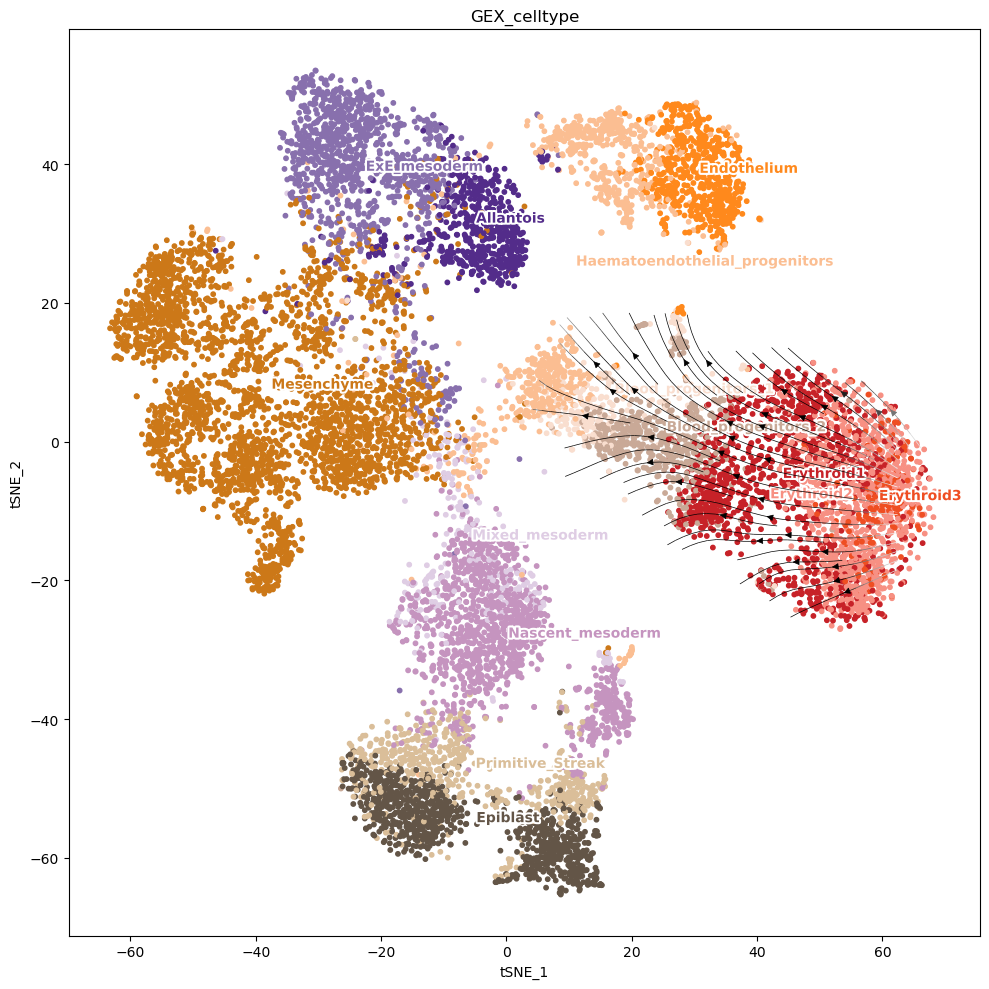

In [108]:
_ = plot_perturbation_effect_in_embedding(
        scplus_obj = scplus_obj,
        reduction_name = 'eRegulons_tSNE',
        n_cpu = 30,
        perturbation = {'Runx1': 0}, #specifies that we want to set the expression of SOX10 to 0 in all cells.
        variable = 'GEX_celltype',
        color_dictionary = {'GEX_celltype': color_dict_line},
        genes_to_use = hvg,
        figsize = (10, 10))

In [109]:
# from scenicplus.simulation import * 
# regressor_hvg = train_gene_expression_models(
#         scplus_obj,
#         eRegulon_metadata_key = 'eRegulon_metadata_filtered',
#         genes = hvg)

2022-08-29 14:20:01,631 perturbation INFO     Caclulating perturbation matrix for: {'Tal1': 0} over 5 iterations.


100%|██████████| 200/200 [04:59<00:00,  1.50s/it]


2022-08-29 14:28:13,434 perturbation INFO     Generating ranking based on perturbed matrix.
2022-08-29 14:29:00,552 perturbation INFO     Scoring eRegulons.
2022-08-29 14:29:20,426 perturbation INFO     Projecting perturbation effect in embedding: eRegulons_tSNE
2022-08-29 14:29:54,989 perturbation INFO     Calculating grid of arrows
2022-08-29 14:29:55,078 perturbation INFO     Plotting


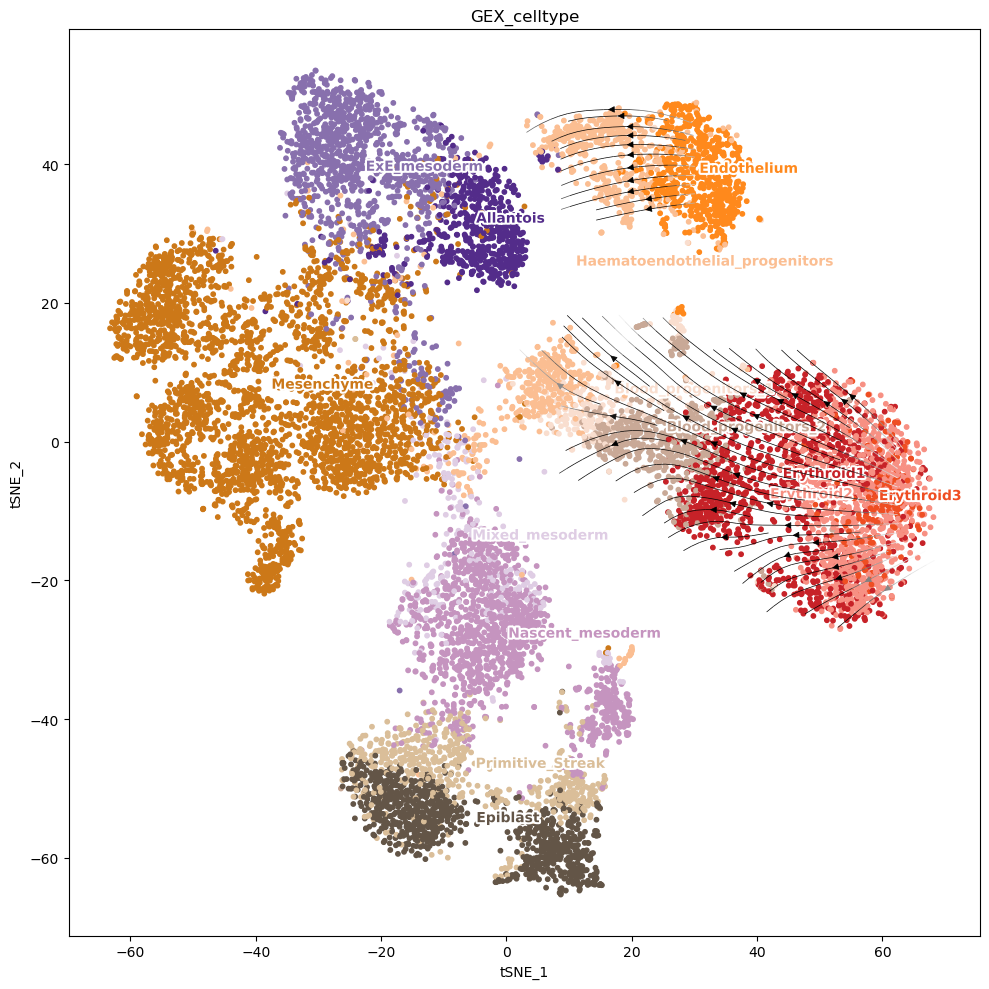

In [110]:
_ = plot_perturbation_effect_in_embedding(
        scplus_obj = scplus_obj,
        reduction_name = 'eRegulons_tSNE',
        n_cpu = 30,
        perturbation = {'Tal1': 0}, #specifies that we want to set the expression of SOX10 to 0 in all cells.
        variable = 'GEX_celltype',
        color_dictionary = {'GEX_celltype': color_dict_line},
        genes_to_use = hvg,
        figsize = (10, 10))

2022-08-29 14:29:58,741 perturbation INFO     Caclulating perturbation matrix for: {'Tal1': 9} over 5 iterations.


100%|██████████| 200/200 [05:02<00:00,  1.51s/it]


2022-08-29 14:38:16,680 perturbation INFO     Generating ranking based on perturbed matrix.
2022-08-29 14:39:02,828 perturbation INFO     Scoring eRegulons.
2022-08-29 14:39:22,075 perturbation INFO     Projecting perturbation effect in embedding: eRegulons_tSNE
2022-08-29 14:39:56,806 perturbation INFO     Calculating grid of arrows
2022-08-29 14:39:56,896 perturbation INFO     Plotting


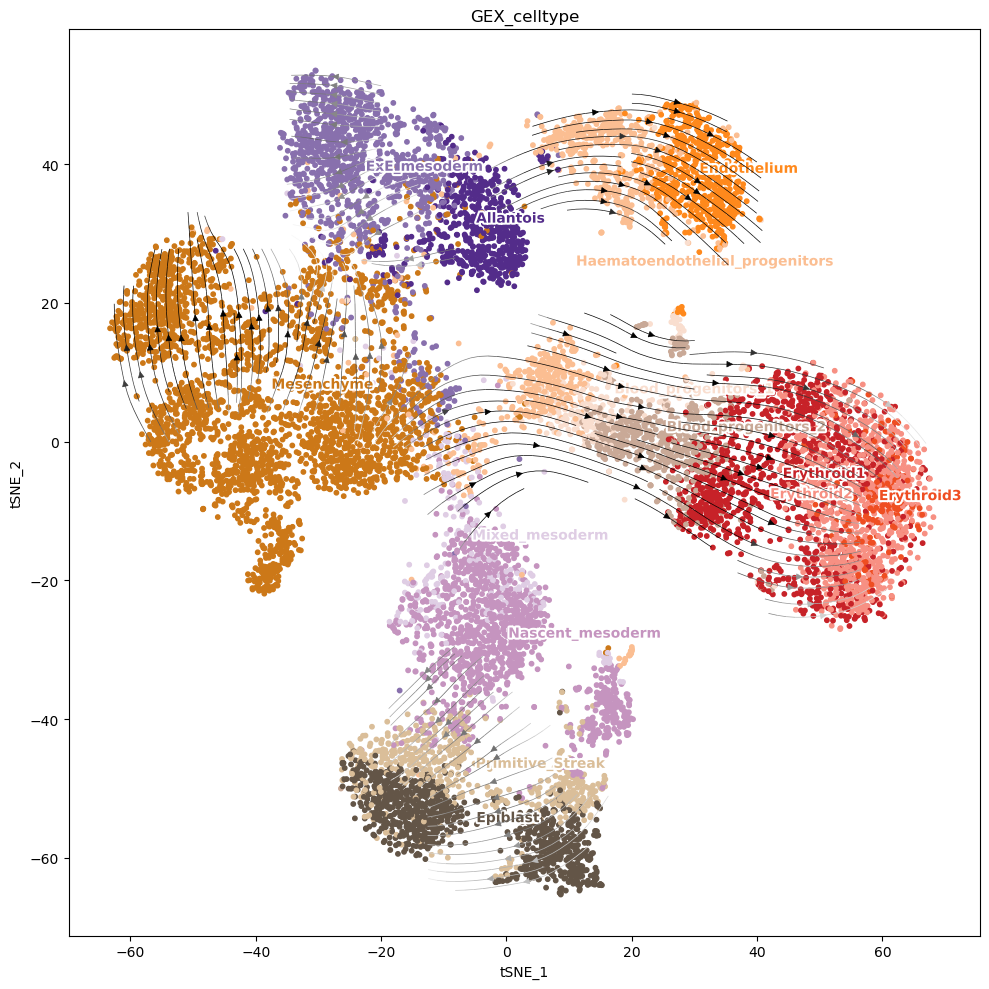

In [111]:
_ = plot_perturbation_effect_in_embedding(
        scplus_obj = scplus_obj,
        reduction_name = 'eRegulons_tSNE',
        n_cpu = 30,
        perturbation = {'Tal1': 9}, #specifies that we want to set the expression of SOX10 to 0 in all cells.
        variable = 'GEX_celltype',
        color_dictionary = {'GEX_celltype': color_dict_line},
        genes_to_use = hvg,
        figsize = (10, 10))

2022-08-29 15:24:46,231 perturbation INFO     Caclulating perturbation matrix for: {'Eomes': 0} over 5 iterations.


100%|██████████| 200/200 [04:53<00:00,  1.47s/it]


2022-08-29 15:33:11,604 perturbation INFO     Generating ranking based on perturbed matrix.
2022-08-29 15:33:57,195 perturbation INFO     Scoring eRegulons.
2022-08-29 15:34:17,062 perturbation INFO     Projecting perturbation effect in embedding: eRegulons_tSNE
2022-08-29 15:34:52,512 perturbation INFO     Calculating grid of arrows
2022-08-29 15:34:52,607 perturbation INFO     Plotting


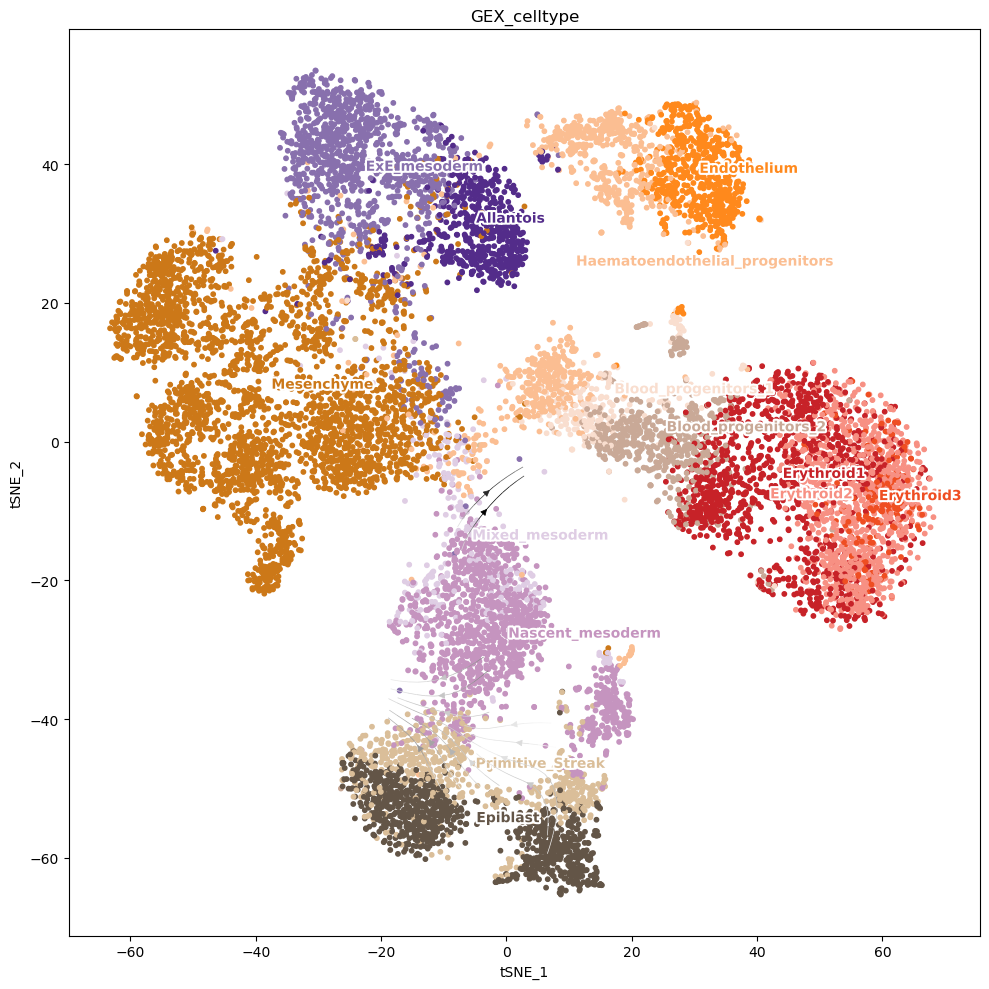

In [137]:
_ = plot_perturbation_effect_in_embedding(
        scplus_obj = scplus_obj,
        reduction_name = 'eRegulons_tSNE',
        n_cpu = 30,
        perturbation = {'Eomes': 0}, #specifies that we want to set the expression of SOX10 to 0 in all cells.
        variable = 'GEX_celltype',
        color_dictionary = {'GEX_celltype': color_dict_line},
        genes_to_use = hvg,
        figsize = (10, 10))

2022-08-29 15:50:40,986 perturbation INFO     Caclulating perturbation matrix for: {'Mixl1': 0} over 5 iterations.


100%|██████████| 200/200 [04:50<00:00,  1.45s/it]


2022-08-29 15:58:57,776 perturbation INFO     Generating ranking based on perturbed matrix.
2022-08-29 15:59:43,170 perturbation INFO     Scoring eRegulons.
2022-08-29 16:00:02,121 perturbation INFO     Projecting perturbation effect in embedding: eRegulons_tSNE
2022-08-29 16:00:36,717 perturbation INFO     Calculating grid of arrows
2022-08-29 16:00:36,810 perturbation INFO     Plotting


ValueError: need at least one array to concatenate

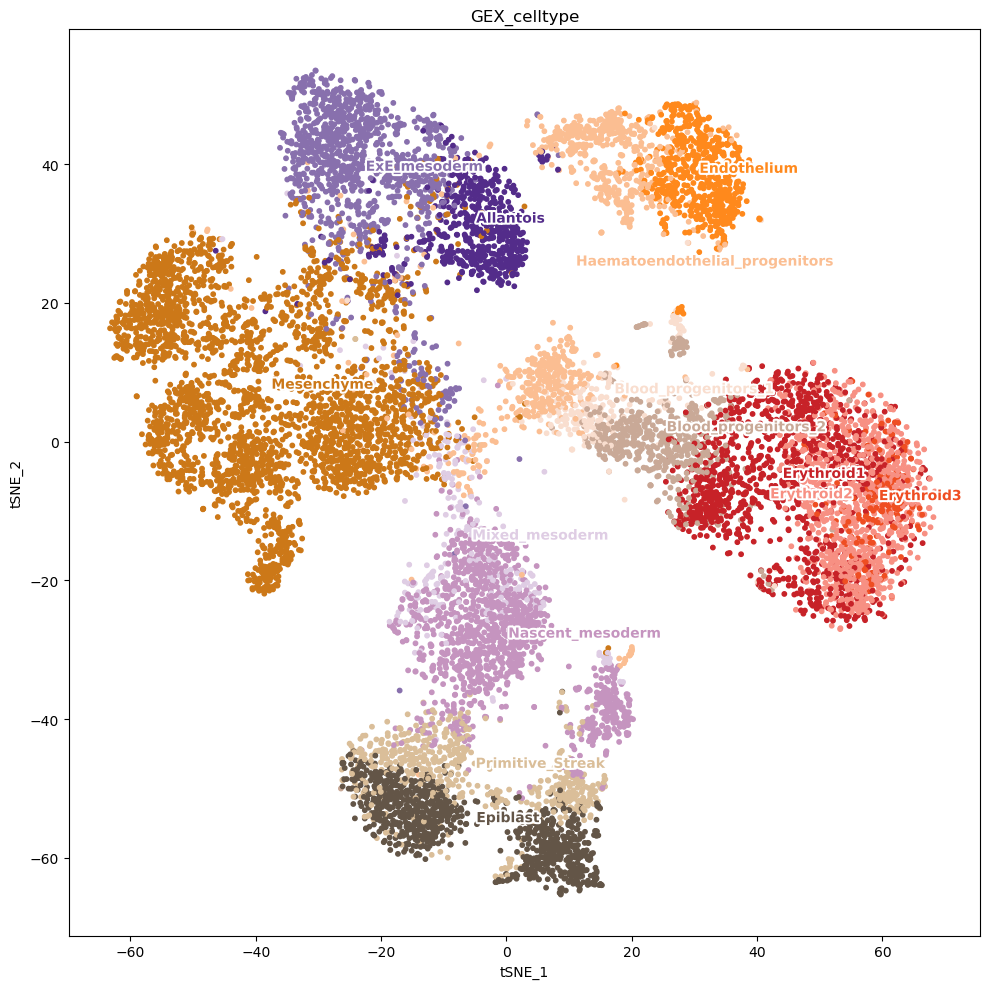

In [146]:
_ = plot_perturbation_effect_in_embedding(
        scplus_obj = scplus_obj,
        reduction_name = 'eRegulons_tSNE',
        n_cpu = 30,
        perturbation = {'Mixl1': 0}, #specifies that we want to set the expression of SOX10 to 0 in all cells.
        variable = 'GEX_celltype',
        color_dictionary = {'GEX_celltype': color_dict_line},
        genes_to_use = hvg,
        figsize = (10, 10))

2022-08-29 16:01:56,405 perturbation INFO     Caclulating perturbation matrix for: {'T': 0} over 5 iterations.


100%|██████████| 200/200 [04:56<00:00,  1.48s/it]


2022-08-29 16:10:19,922 perturbation INFO     Generating ranking based on perturbed matrix.
2022-08-29 16:11:05,357 perturbation INFO     Scoring eRegulons.
2022-08-29 16:11:24,346 perturbation INFO     Projecting perturbation effect in embedding: eRegulons_tSNE
2022-08-29 16:11:58,161 perturbation INFO     Calculating grid of arrows
2022-08-29 16:11:58,253 perturbation INFO     Plotting


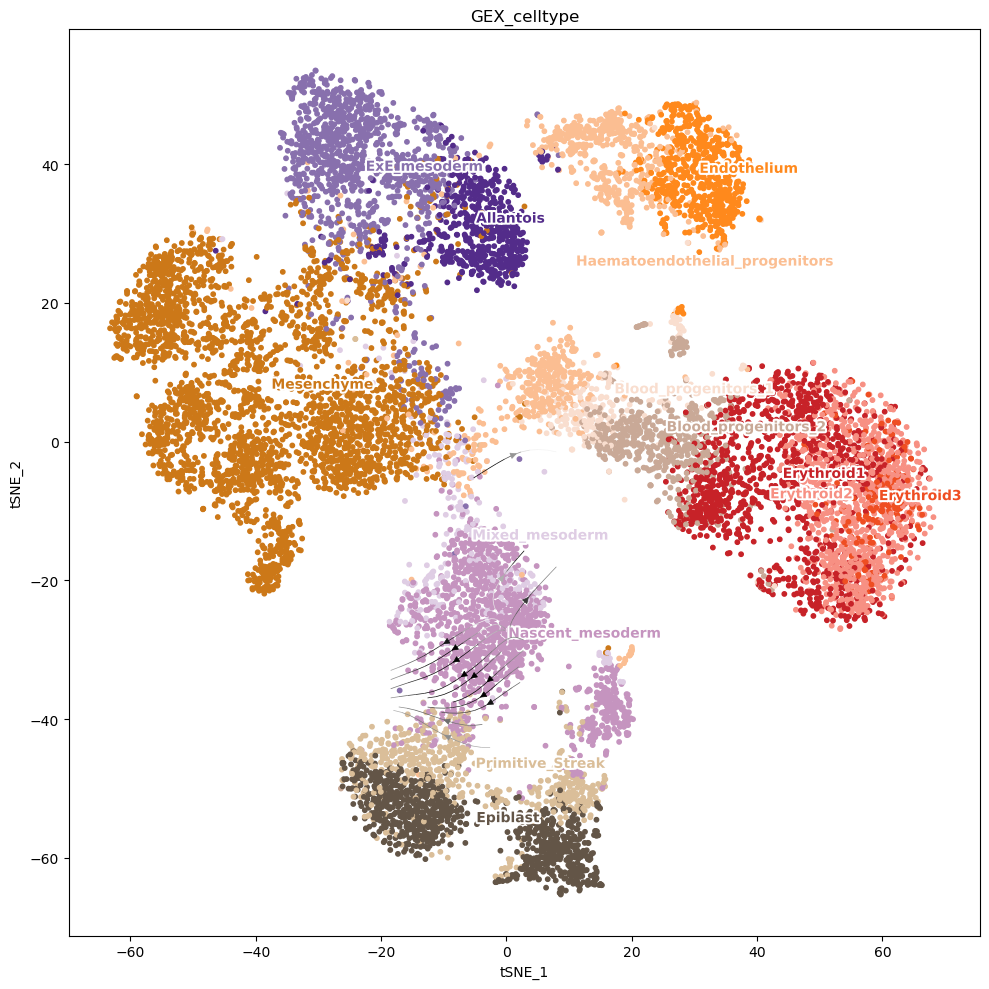

In [147]:
_ = plot_perturbation_effect_in_embedding(
        scplus_obj = scplus_obj,
        reduction_name = 'eRegulons_tSNE',
        n_cpu = 30,
        perturbation = {'T': 0}, #specifies that we want to set the expression of SOX10 to 0 in all cells.
        variable = 'GEX_celltype',
        color_dictionary = {'GEX_celltype': color_dict_line},
        genes_to_use = hvg,
        figsize = (10, 10))

2022-08-29 16:12:01,980 perturbation INFO     Caclulating perturbation matrix for: {'Hoxb9': 0} over 5 iterations.


100%|██████████| 200/200 [04:48<00:00,  1.44s/it]


2022-08-29 16:17:09,384 perturbation INFO     Generating ranking based on perturbed matrix.
2022-08-29 16:17:54,627 perturbation INFO     Scoring eRegulons.
2022-08-29 16:18:13,817 perturbation INFO     Projecting perturbation effect in embedding: eRegulons_tSNE
2022-08-29 16:18:46,617 perturbation INFO     Calculating grid of arrows
2022-08-29 16:18:46,705 perturbation INFO     Plotting


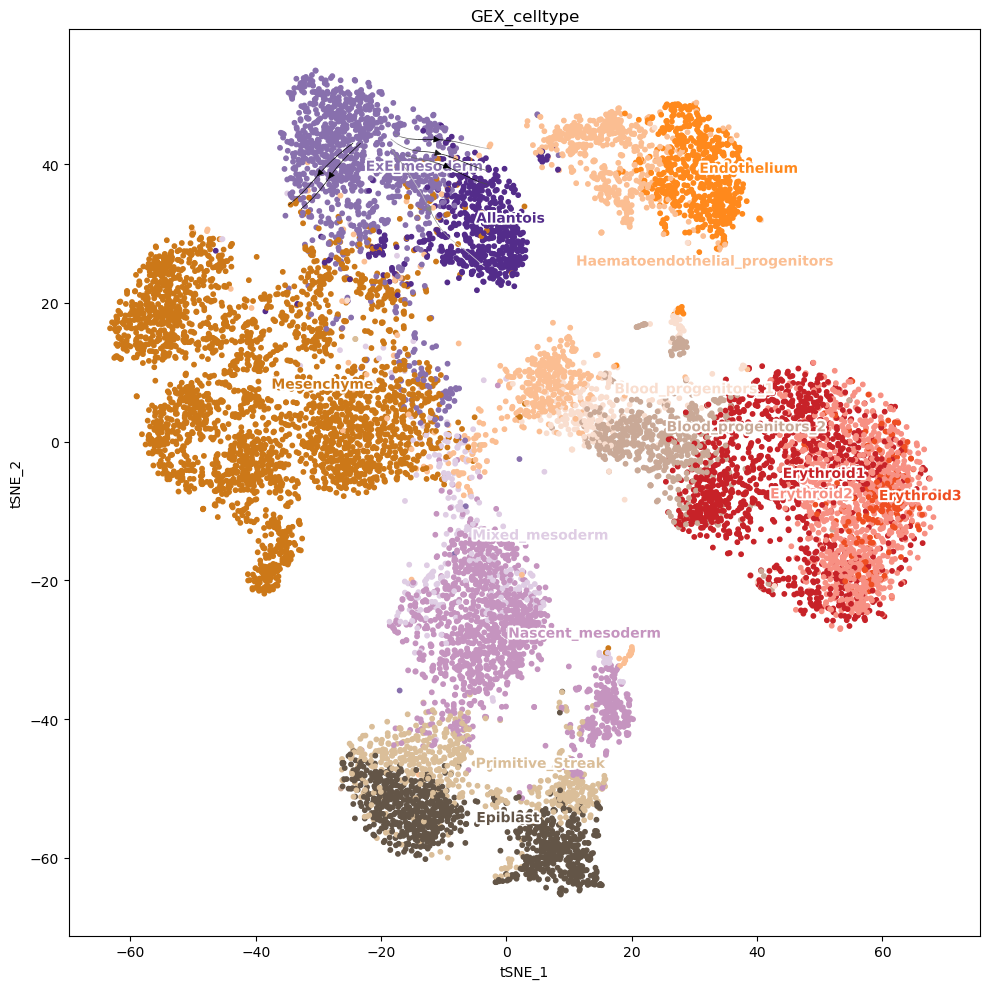

In [148]:
_ = plot_perturbation_effect_in_embedding(
        scplus_obj = scplus_obj,
        reduction_name = 'eRegulons_tSNE',
        n_cpu = 30,
        perturbation = {'Hoxb9': 0}, #specifies that we want to set the expression of SOX10 to 0 in all cells.
        variable = 'GEX_celltype',
        color_dictionary = {'GEX_celltype': color_dict_line},
        genes_to_use = hvg,
        figsize = (10, 10))

2022-08-29 16:18:50,384 perturbation INFO     Caclulating perturbation matrix for: {'Runx1': 0, 'Tal1': 0, 'Stat3': 0} over 5 iterations.


100%|██████████| 200/200 [04:49<00:00,  1.45s/it]


2022-08-29 16:26:39,652 perturbation INFO     Generating ranking based on perturbed matrix.
2022-08-29 16:27:24,671 perturbation INFO     Scoring eRegulons.
2022-08-29 16:27:43,858 perturbation INFO     Projecting perturbation effect in embedding: eRegulons_tSNE
2022-08-29 16:28:19,086 perturbation INFO     Calculating grid of arrows
2022-08-29 16:28:19,177 perturbation INFO     Plotting


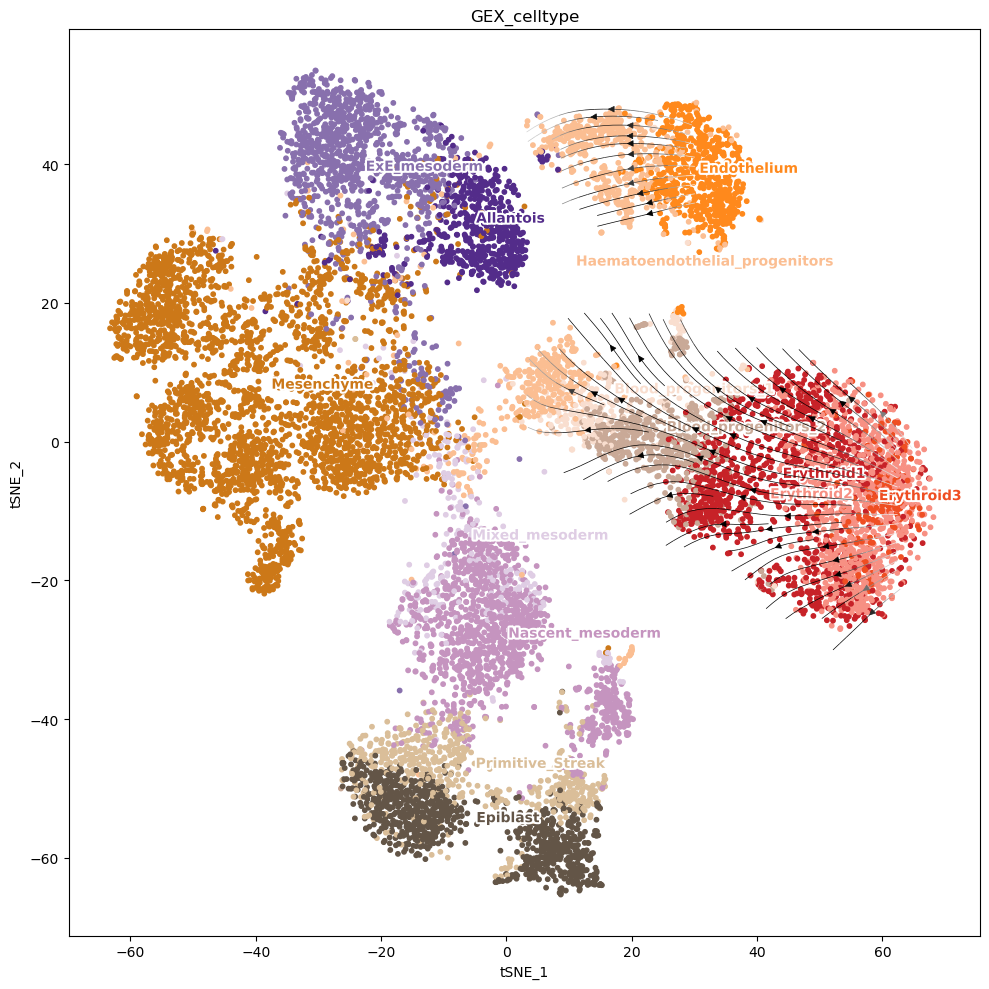

In [149]:
_ = plot_perturbation_effect_in_embedding(
        scplus_obj = scplus_obj,
        reduction_name = 'eRegulons_tSNE',
        n_cpu = 30,
        perturbation = {'Runx1': 0, 'Tal1': 0, 'Stat3': 0}, #specifies that we want to set the expression of SOX10 to 0 in all cells.
        variable = 'GEX_celltype',
        color_dictionary = {'GEX_celltype': color_dict_line},
        genes_to_use = hvg,
        figsize = (10, 10))

2022-08-29 16:28:22,919 perturbation INFO     Caclulating perturbation matrix for: {'Lmo2': 0} over 5 iterations.


100%|██████████| 200/200 [04:50<00:00,  1.45s/it]


2022-08-29 16:36:51,728 perturbation INFO     Generating ranking based on perturbed matrix.
2022-08-29 16:37:37,774 perturbation INFO     Scoring eRegulons.
2022-08-29 16:37:56,969 perturbation INFO     Projecting perturbation effect in embedding: eRegulons_tSNE
2022-08-29 16:38:31,343 perturbation INFO     Calculating grid of arrows
2022-08-29 16:38:31,436 perturbation INFO     Plotting


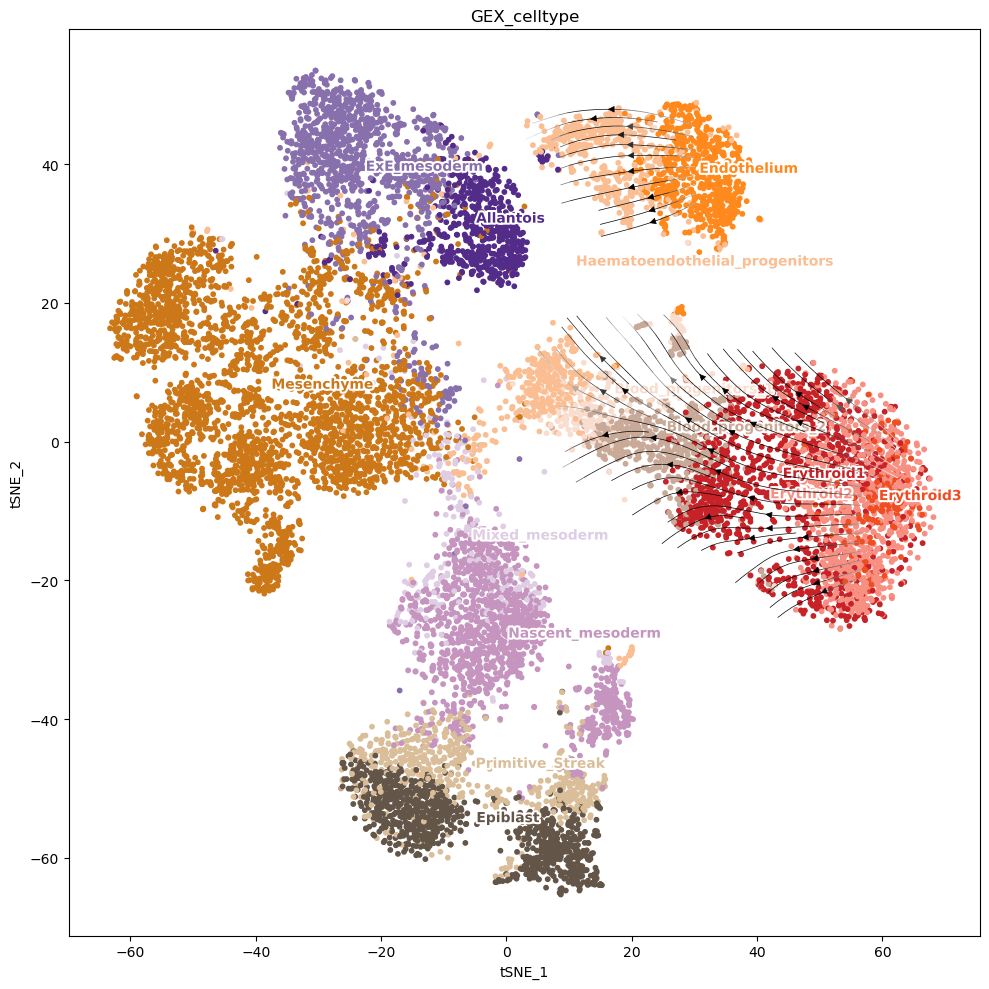

In [150]:
_ = plot_perturbation_effect_in_embedding(
        scplus_obj = scplus_obj,
        reduction_name = 'eRegulons_tSNE',
        n_cpu = 30,
        perturbation = {'Lmo2': 0}, #specifies that we want to set the expression of SOX10 to 0 in all cells.
        variable = 'GEX_celltype',
        color_dictionary = {'GEX_celltype': color_dict_line},
        genes_to_use = hvg,
        figsize = (10, 10))

2022-08-29 16:38:35,413 perturbation INFO     Caclulating perturbation matrix for: {'Fli1': 0} over 5 iterations.


100%|██████████| 200/200 [04:50<00:00,  1.45s/it]


2022-08-29 16:46:30,792 perturbation INFO     Generating ranking based on perturbed matrix.
2022-08-29 16:47:16,347 perturbation INFO     Scoring eRegulons.
2022-08-29 16:47:43,985 perturbation INFO     Projecting perturbation effect in embedding: eRegulons_tSNE
2022-08-29 16:48:17,440 perturbation INFO     Calculating grid of arrows
2022-08-29 16:48:17,532 perturbation INFO     Plotting


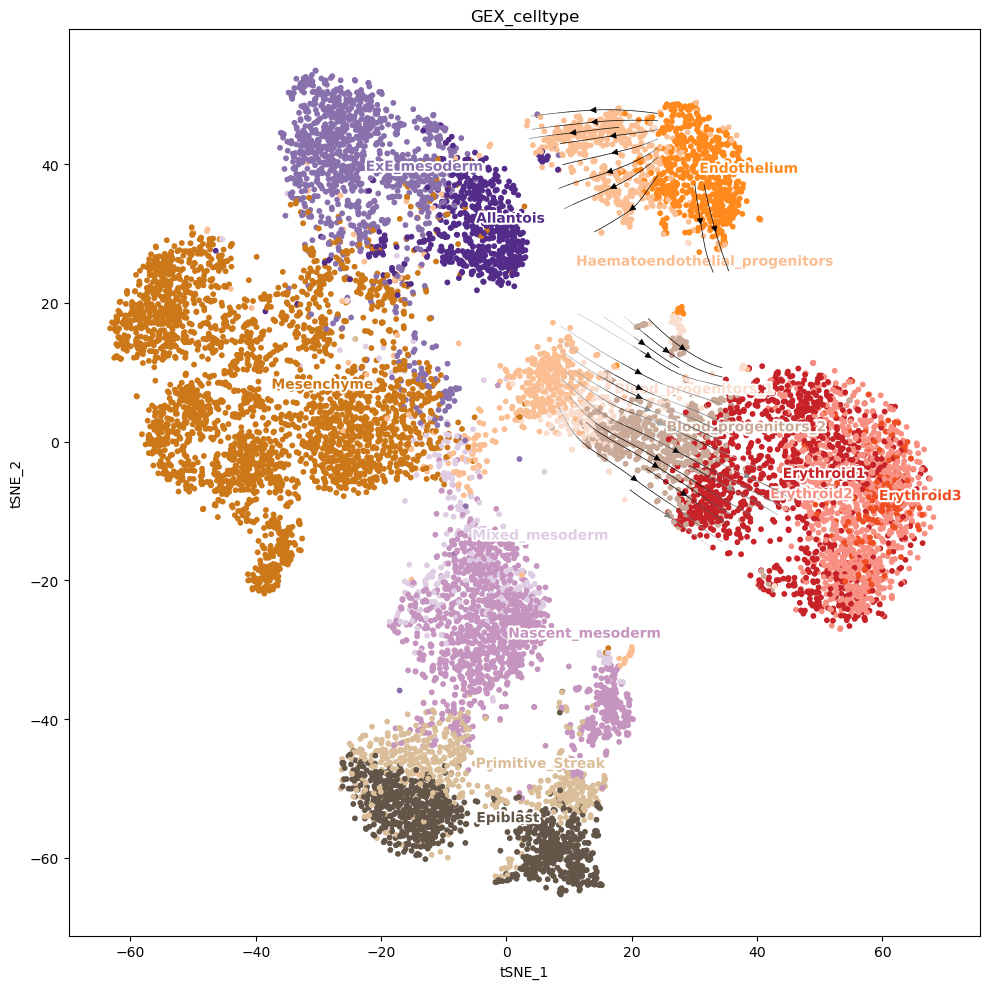

In [151]:
_ = plot_perturbation_effect_in_embedding(
        scplus_obj = scplus_obj,
        reduction_name = 'eRegulons_tSNE',
        n_cpu = 30,
        perturbation = {'Fli1': 0}, #specifies that we want to set the expression of SOX10 to 0 in all cells.
        variable = 'GEX_celltype',
        color_dictionary = {'GEX_celltype': color_dict_line},
        genes_to_use = hvg,
        figsize = (10, 10))

2022-08-29 16:48:22,677 perturbation INFO     Caclulating perturbation matrix for: {'Erg': 0} over 5 iterations.


100%|██████████| 200/200 [04:53<00:00,  1.47s/it]


2022-08-29 16:56:23,826 perturbation INFO     Generating ranking based on perturbed matrix.
2022-08-29 16:57:08,996 perturbation INFO     Scoring eRegulons.
2022-08-29 16:57:28,502 perturbation INFO     Projecting perturbation effect in embedding: eRegulons_tSNE
2022-08-29 16:58:01,795 perturbation INFO     Calculating grid of arrows
2022-08-29 16:58:01,891 perturbation INFO     Plotting


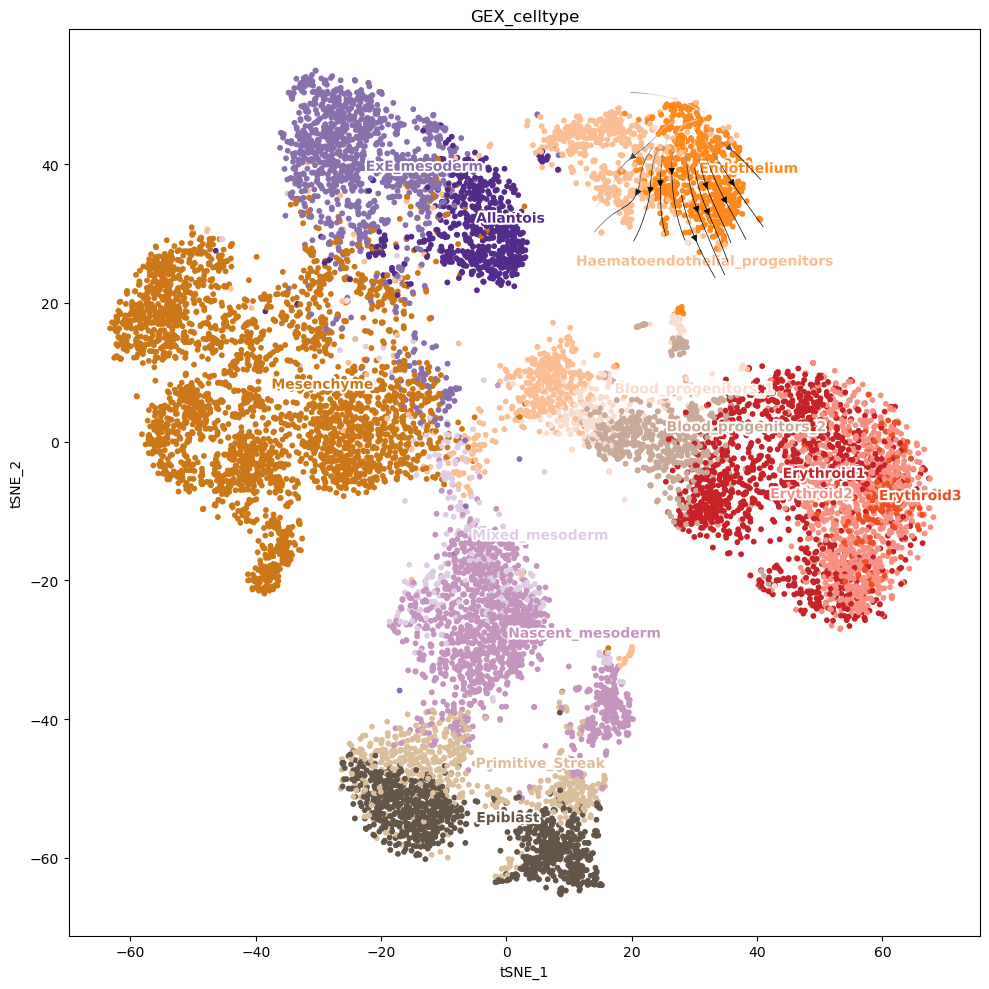

In [152]:
_ = plot_perturbation_effect_in_embedding(
        scplus_obj = scplus_obj,
        reduction_name = 'eRegulons_tSNE',
        n_cpu = 30,
        perturbation = {'Erg': 0}, #specifies that we want to set the expression of SOX10 to 0 in all cells.
        variable = 'GEX_celltype',
        color_dictionary = {'GEX_celltype': color_dict_line},
        genes_to_use = hvg,
        figsize = (10, 10))

2022-08-29 16:58:05,542 perturbation INFO     Caclulating perturbation matrix for: {'Sox7': 0} over 5 iterations.


100%|██████████| 200/200 [04:49<00:00,  1.45s/it]


2022-08-29 17:05:35,974 perturbation INFO     Generating ranking based on perturbed matrix.
2022-08-29 17:06:21,205 perturbation INFO     Scoring eRegulons.
2022-08-29 17:06:40,901 perturbation INFO     Projecting perturbation effect in embedding: eRegulons_tSNE
2022-08-29 17:07:14,913 perturbation INFO     Calculating grid of arrows
2022-08-29 17:07:15,010 perturbation INFO     Plotting


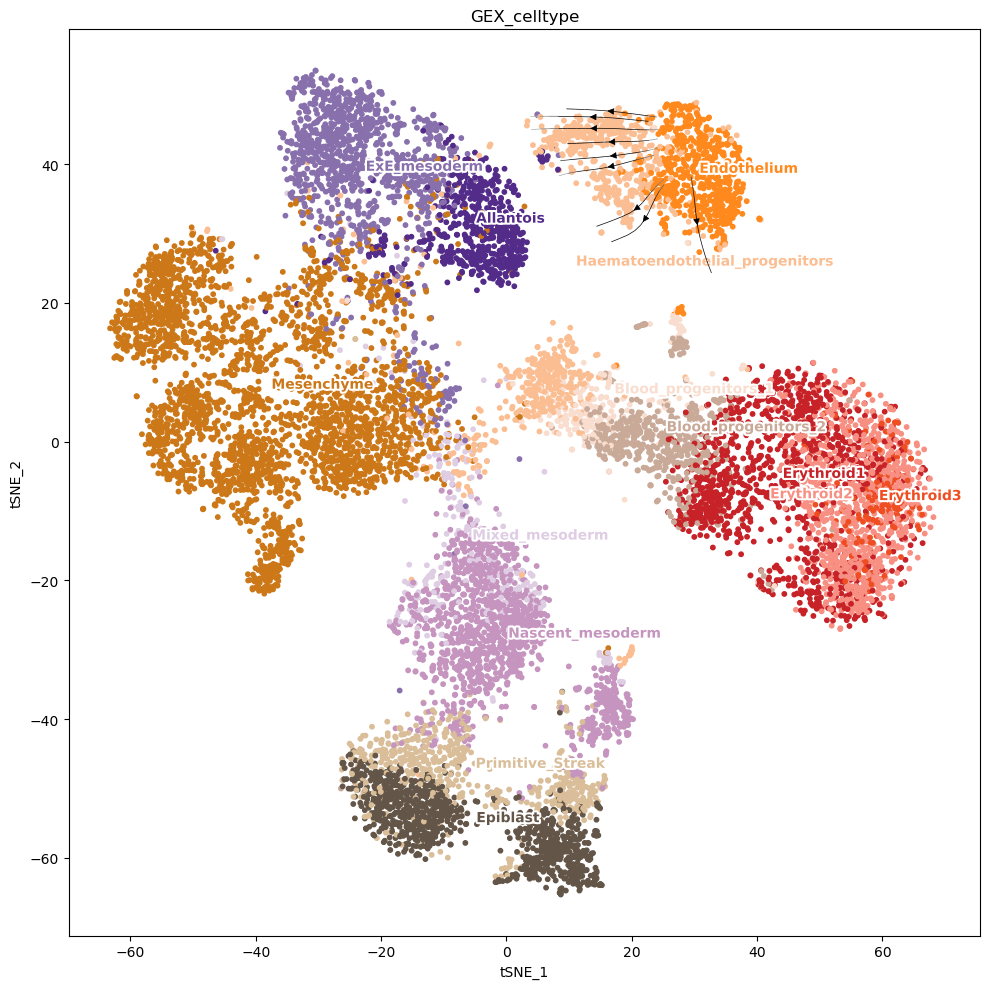

In [153]:
_ = plot_perturbation_effect_in_embedding(
        scplus_obj = scplus_obj,
        reduction_name = 'eRegulons_tSNE',
        n_cpu = 30,
        perturbation = {'Sox7': 0}, #specifies that we want to set the expression of SOX10 to 0 in all cells.
        variable = 'GEX_celltype',
        color_dictionary = {'GEX_celltype': color_dict_line},
        genes_to_use = hvg,
        figsize = (10, 10))

### GRN Velocity!